In [1]:
import os 
import datetime
from datetime import timedelta 
import time

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

sns.set_theme()
mpl.rcParams['figure.figsize']=(10,8)
mpl.rcParams['axes.grid']=True
%config InlineBackend.figure_format = 'retina'

# Data Wrangling
- Loading the dataset
- Data wrangling for missing variables.
- Data transformation.
- Data visualization

## Loading Dataset

In [2]:
#df = pd.read_excel('Data_B2_Aug22.xlsx',sheet_name='Data GT22',index_col='Time',parse_dates=True)  #for Local Repository

PATH = 'https://raw.githubusercontent.com/WisitTee/Thesis/main/Data_GT22_Aug22.csv'
df = pd.read_csv(PATH,index_col='Time',parse_dates=True)
df.head(5)

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,...,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY
Time,,,,,,,,,,,,,,,,,,,,,
2022-08-01 09:49:00,78.70,27.24,3.42,14.08,0.94,22.87,51.30,3002.63,5.78,5.56,...,2488.58,17.88,240.98,196.37,9.74,540.82,107.00,95.38,27.98,85.83
2022-08-01 09:50:00,78.74,28.40,3.42,14.11,0.94,22.87,51.34,2998.13,5.46,5.60,...,2478.03,18.04,240.60,194.50,9.69,540.99,106.94,94.75,27.98,85.83
2022-08-01 09:51:00,78.76,29.16,3.43,14.14,0.93,22.88,51.32,2998.88,6.03,6.26,...,2489.64,18.13,239.44,197.84,9.77,540.97,106.80,94.75,27.99,85.83
2022-08-01 09:52:00,79.26,29.00,3.44,14.10,0.93,22.88,51.26,3000.38,6.60,6.62,...,2487.26,18.05,240.25,196.37,9.65,540.58,106.66,94.63,27.97,85.83
2022-08-01 09:53:00,78.06,28.68,3.40,14.11,0.93,22.89,51.32,2999.25,5.86,6.66,...,2467.92,18.33,239.73,198.70,10.04,540.10,106.71,95.38,27.98,85.83


## Checking Missing Value  & Data Distributions

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39182 entries, 2022-08-01 09:49:00 to 2022-08-31 23:59:00
Data columns (total 46 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   GT22_GEN_WATT            39182 non-null  float64
 1   GT22_GEN_VAR             39182 non-null  float64
 2   GT22_GEN_CURRENT         39182 non-null  float64
 3   GT22_GEN_VOLTAGE         39182 non-null  float64
 4   GT22_PWR_FACTOR          39182 non-null  float64
 5   GT22_FUEL_GAS_PRESS      39182 non-null  float64
 6   GT22_CSO                 39182 non-null  float64
 7   GT22_SPEED               39182 non-null  float64
 8   GT22_IGV_CSO             39182 non-null  float64
 9   GT22_IGV_FB              39182 non-null  float64
 10  GT22_EXH_DAMPER_CMD      39182 non-null  float64
 11  GT22_EXH_DAMPER_FB       39182 non-null  float64
 12  GT22_COMP_IN_AIR_TEMP    39182 non-null  float64
 13  GT22_RCA_TEMP_R          39182 non-null  

In [4]:
pd.set_option('display.max_columns', None) #to preview all columns
df.describe()

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,GT22_EXH_DAMPER_CMD,GT22_EXH_DAMPER_FB,GT22_COMP_IN_AIR_TEMP,GT22_RCA_TEMP_R,GT22_RCA_TEMP_L,GT22_DISC_TEMP2_R,GT22_DISC_TEMP2_L,GT22_DISC_TEMP3_R,GT22_DISC_TEMP3_L,GT22_DISC_TEMP4_R,GT22_DISC_TEMP4_L,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_WTR_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_RAW_NOX,GT22_OXYGEN,GT22_INLET_AIR_FLOW,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY
count,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.0,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.0,39182.000000,39182.000000,39182.000000,39182.000000,39182.00000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000,39182.000000
mean,79.101369,14.737455,3.316201,13.871278,0.910826,22.970139,51.118798,2999.906255,7.295486,7.346357,100.0,103.832478,26.458490,193.566902,193.194789,334.267144,362.765202,364.412297,383.630384,334.235821,363.280111,559.518104,543.121716,28.067752,30.774098,3.828214,0.0,371.286276,9.525589,43.269768,43.456277,445.98271,1015.732774,99.272400,15.145727,324.916306,2476.633937,18.982575,239.771321,199.785577,9.690108,538.356689,107.088465,94.707884,28.552181,82.449072
std,5.287101,8.033899,0.230534,0.130120,0.351203,0.335222,0.983645,1.941733,9.469278,9.426359,0.0,0.056342,2.564373,6.095301,6.030793,4.567565,5.127813,5.829716,5.909166,6.490832,7.276172,10.321442,8.417939,1.236901,1.599250,0.993223,0.0,6.441954,0.393309,1.880088,1.799215,6.39333,86.847961,2.859009,0.131948,134.045999,217.400309,1.330505,2.385549,14.473813,1.060987,7.670089,0.921802,3.427561,2.531593,9.512333
min,53.420000,-12.080000,2.200000,13.400000,-1.000000,22.040000,45.450000,2993.250000,0.000000,-0.800000,100.0,103.560000,21.770000,178.790000,178.300000,310.260000,335.430000,321.210000,341.260000,294.560000,317.710000,476.670000,481.780000,22.070000,25.780000,1.500000,0.0,354.140000,8.540000,39.030000,39.250000,412.50000,847.950000,74.850000,14.750000,133.100000,1449.430000,17.090000,216.890000,179.190000,6.340000,481.370000,105.280000,73.750000,24.330000,47.540000
25%,78.360000,9.080000,3.260000,13.780000,0.960000,22.820000,51.010000,2998.500000,4.180000,4.230000,100.0,103.810000,24.430000,189.900000,189.550000,332.430000,359.570000,363.640000,382.400000,332.700000,361.510000,561.090000,544.800000,27.890000,29.750000,3.270000,0.0,367.220000,9.410000,41.750000,41.990000,442.80000,972.675000,99.170000,15.100000,319.900000,2446.360000,18.310000,239.150000,195.020000,9.250000,539.520000,106.650000,94.500000,26.510000,75.320000
50%,78.680000,15.080000,3.300000,13.880000,0.980000,22.900000,51.110000,3000.000000,5.530000,5.590000,100.0,103.810000,25.890000,192.400000,191.940000,333.690000,361.760000,364.840000,383.630000,335.470000,364.710000,561.520000,544.980000,27.960000,30.370000,3.630000,0.0,369.800000,9.460000,43.180000,43.480000,448.27000,999.825000,99.780000,15.120000,320.400000,2467.030000,18.640000,239.950000,197.040000,9.570000,540.060000,106.890000,94.880000,27.990000,85.720000
75%,79.580000,20.200000,3.340000,13.960000,0.990000,22.980000,51.230000,3001.500000,7.110000,7.170000,100.0,103.880000,28.450000,196.120000,195.830000,336.150000,366.370000,366.300000,385.870000,337.850000,367.080000,561.940000,545.120000,28.190000,31.800000,4.190000,0.0,374.350000,9.530000,44.980000,45.160000,45

## Data Transformation 

In [5]:
#Average RCA and Discavity Temp
df['GT22_RCA_TEMP_AVG'] = (df['GT22_RCA_TEMP_R'] + df['GT22_RCA_TEMP_L']) / 2
df['GT22_DISC_TEMP2_AVG'] = (df['GT22_DISC_TEMP2_R'] + df['GT22_DISC_TEMP2_L']) / 2
df['GT22_DISC_TEMP3_AVG'] = (df['GT22_DISC_TEMP3_R'] + df['GT22_DISC_TEMP3_L']) / 2
df['GT22_DISC_TEMP4_AVG'] = (df['GT22_DISC_TEMP4_R'] + df['GT22_DISC_TEMP4_L']) / 2

### Drop the Unusual periods

In [6]:
#Water Injection Period
df = df.drop(df[df.GT22_WTR_INJ_FLOW > 0.5].index)
df = df.drop(df[df.GT22_STEAM_INJ_FLOW < 2.5].index)

#NOx Outlier Period
df = df.drop(df[df.GT22_NOX_7O2 < 200].index)
df = df.drop(df[df.GT22_NOX_7O2 > 300].index)

In [7]:
df.head()

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,GT22_EXH_DAMPER_CMD,GT22_EXH_DAMPER_FB,GT22_COMP_IN_AIR_TEMP,GT22_RCA_TEMP_R,GT22_RCA_TEMP_L,GT22_DISC_TEMP2_R,GT22_DISC_TEMP2_L,GT22_DISC_TEMP3_R,GT22_DISC_TEMP3_L,GT22_DISC_TEMP4_R,GT22_DISC_TEMP4_L,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_WTR_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_RAW_NOX,GT22_OXYGEN,GT22_INLET_AIR_FLOW,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT22_RCA_TEMP_AVG,GT22_DISC_TEMP2_AVG,GT22_DISC_TEMP3_AVG,GT22_DISC_TEMP4_AVG
Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-08-01 09:49:00,78.70,27.24,3.42,14.08,0.94,22.87,51.30,3002.63,5.78,5.56,100.0,103.81,25.87,191.40,191.02,332.90,357.33,360.78,383.31,338.18,363.25,562.94,545.33,28.08,31.40,3.73,0.0,369.67,9.45,43.10,43.42,451.50,1001.55,100.42,15.11,133.1,2488.58,17.88,240.98,196.37,9.74,540.82,107.00,95.38,27.98,85.83,191.210,345.115,372.045,350.715
2022-08-01 09:50:00,78.74,28.40,3.42,14.11,0.94,22.87,51.34,2998.13,5.46,5.60,100.0,103.81,26.18,191.40,191.28,332.97,357.00,360.85,383.29,337.88,363.13,562.87,545.48,28.02,31.40,3.86,0.0,369.81,9.44,43.12,43.39,451.50,1001.40,100.30,15.11,133.1,2478.03,18.04,240.60,194.50,9.69,540.99,106.94,94.75,27.98,85.83,191.340,344.985,372.070,350.505
2022-08-01 09:51:00,78.76,29.16,3.43,14.14,0.93,22.88,51.32,2998.88,6.03,6.26,100.0,103.81,26.38,191.25,191.20,332.91,357.06,360.83,383.29,337.69,362.95,563.21,545.59,28.09,31.40,3.80,0.0,369.69,9.46,43.11,43.45,451.55,1003.21,99.82,15.11,133.1,2489.64,18.13,239.44,197.84,9.77,540.97,106.80,94.75,27.99,85.83,191.225,344.985,372.060,350.320
2022-08-01 09:52:00,79.26,29.00,3.44,14.10,0.93,22.88,51.26,3000.38,6.60,6.62,100.0,103.81,26.49,191.41,191.37,333.08,357.19,360.85,383.39,337.55,362.79,562.41,545.59,28.08,31.37,3.81,0.0,369.99,9.47,43.14,43.48,451.60,1004.89,100.09,15.11,133.1,2487.26,18.05,240.25,196.37,9.65,540.58,106.66,94.63,27.97,85.83,191.390,345.135,372.120,350.170
2022-08-01 09:53:00,78.06,28.68,3.40,14.11,0.93,22.89,51.32,2999.25,5.86,6.66,100.0,103.81,26.61,191.70,191.58,333.05,357.52,360.79,383.03,337.05,362.12,561.48,545.40,27.97,31.41,4.07,0.0,370.02,9.47,43.18,43.48,451.60,1005.25,99.69,15.12,133.1,2467.92,18.33,239.73,198.70,10.04,540.10,106.71,95.38,27.98,85.83,191.640,345.285,371.910,349.585


In [8]:
df.describe()

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_GEN_CURRENT,GT22_GEN_VOLTAGE,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_SPEED,GT22_IGV_CSO,GT22_IGV_FB,GT22_EXH_DAMPER_CMD,GT22_EXH_DAMPER_FB,GT22_COMP_IN_AIR_TEMP,GT22_RCA_TEMP_R,GT22_RCA_TEMP_L,GT22_DISC_TEMP2_R,GT22_DISC_TEMP2_L,GT22_DISC_TEMP3_R,GT22_DISC_TEMP3_L,GT22_DISC_TEMP4_R,GT22_DISC_TEMP4_L,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_WTR_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_RAW_NOX,GT22_OXYGEN,GT22_INLET_AIR_FLOW,GT22_FG_DIFF_PRESS,GT22_INLET_AIR_DIFF_KKU,GT22_NOX_7O2,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT22_RCA_TEMP_AVG,GT22_DISC_TEMP2_AVG,GT22_DISC_TEMP3_AVG,GT22_DISC_TEMP4_AVG
count,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.0,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.0,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000,38684.000000
mean,79.271124,14.777437,3.323508,13.871715,0.910269,22.963245,51.156670,2999.903363,7.370405,7.421289,100.0,103.832828,26.460241,193.664037,193.290809,334.414878,362.920883,364.671609,383.888042,334.496578,363.571742,560.003275,543.516310,28.107431,30.777799,3.848096,0.0,371.389738,9.532555,43.278204,43.464937,446.103726,1016.192925,99.403491,15.139575,324.960866,2483.655391,18.991081,239.839584,199.929315,9.699461,538.698426,107.080603,94.854348,28.553584,82.426548,193.477423,348.667880,374.279826,349.034160
std,5.007519,8.046576,0.219156,0.130429,0.352571,0.327362,0.901707,1.941768,9.501824,9.458461,0.0,0.056384,2.559555,6.050640,5.986601,4.327973,4.896557,5.133917,5.255497,5.896015,6.559425,8.870316,7.269359,1.170535,1.600189,0.983673,0.0,6.388733,0.389359,1.875198,1.793843,6.176183,87.197540,2.471888,0.113384,134.904254,205.981276,1.335383,2.183629,14.495294,1.063265,6.694554,0.921878,3.073559,2.530450,9.514694,6.015489,4.381075,5.147287,6.109075
min,54.060000,-12.080000,2.200000,13.400000,-1.000000,22.040000,45.450000,2993.250000,0.000000,-0.800000,100.0,103.560000,21.770000,178.790000,178.300000,310.260000,335.430000,321.210000,341.260000,294.560000,317.740000,476.670000,481.780000,22.130000,25.780000,2.500000,0.0,354.140000,8.560000,39.030000,39.250000,412.500000,847.950000,74.850000,14.750000,133.100000,1449.430000,17.090000,216.890000,179.190000,6.340000,481.370000,105.280000,74.000000,24.330000,47.540000,178.580000,322.845000,331.390000,306.175000
25%,78.380000,9.120000,3.260000,13.780000,0.960000,22.820000,51.020000,2998.500000,4.220000,4.260000,100.0,103.810000,24.430000,189.950000,189.620000,332.460000,359.630000,363.670000,382.430000,332.837500,361.590000,561.100000,544.810000,27.890000,29.750000,3.290000,0.0,367.290000,9.420000,41.750000,42.000000,442.840000,972.960000,99.190000,15.100000,319.900000,2447.070000,18.320000,239.180000,195.070000,9.260000,539.540000,106.650000,94.500000,26.510000,75.320000,189.765000,346.120000,373.005000,347.395000
50%,78.680000,15.120000,3.300000,13.880000,0.980000,22.900000,51.110000,3000.000000,5.560000,5.610000,100.0,103.810000,25.890000,192.440000,191.990000,333.730000,361.830000,364.870000,383.660000,335.540000,364.770000,561.530000,544.980000,27.960000,30.370000,3.640000,0.0,369.850000,9.460000,43.180000,43.480000,448.300000,1000.200000,99.780000,15.120000,320.440000,2467.345000,18.650000,239.960000,197.070000,9.580000,540.070000,106.880000,94.880000,27.990000,85.720000,192.190000

## Data visualization

### Data Distribution BEFORE Normalization

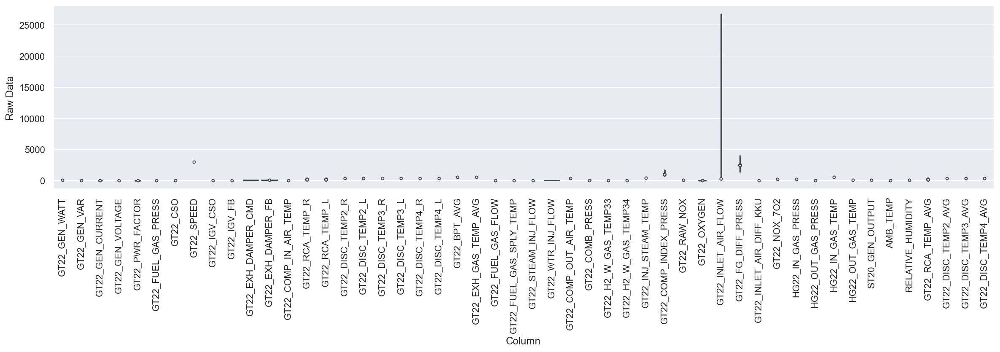

In [9]:
#before normalization 
df_melt = df.melt(var_name='Column', value_name='Raw Data')
#.melt to transform to Long Format (like before pivot table)
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Raw Data', data=df_melt)
ax.set_xticklabels(df.keys(), rotation=90);

### Gen. and NOx 

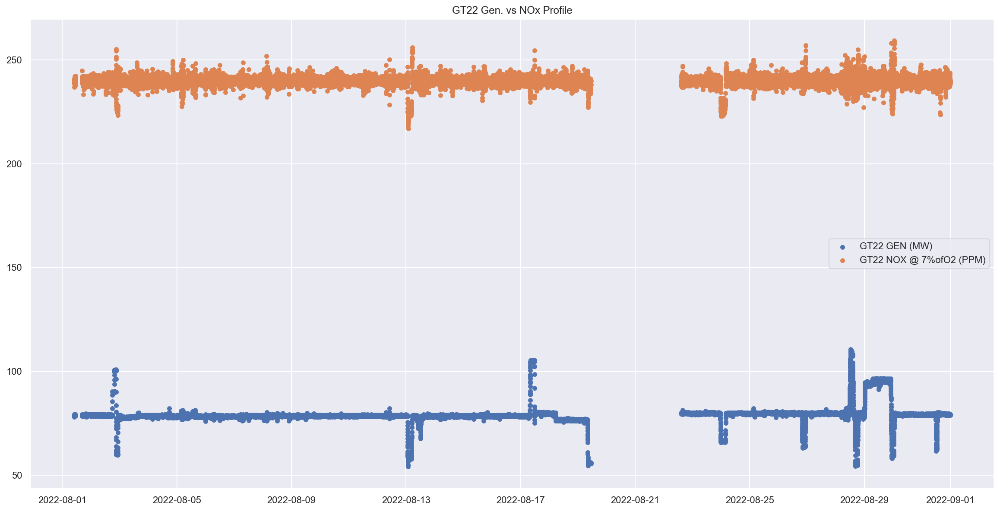

In [10]:
plt.figure(figsize=(20,10))
plt.title('GT22 Gen. vs NOx Profile')
plt.scatter(df.index,df['GT22_GEN_WATT'],s=20,label='GT22 GEN (MW)')
plt.scatter(df.index,df['GT22_NOX_7O2'],s=20,label='GT22 NOX @ 7%ofO2 (PPM)')
plt.legend();

#plt.figure(figsize=(10,5))
#fig, ax = plt.subplots(2,1,sharex=True)
#ax[0].plot(df['GT22_NOX_7O2'], label='GT22 NOX @ 7%ofO2 (PPM)')
#ax[1].plot(df['GT22_GEN_WATT'], label='GT22 GEN (MW)')

### Correlation BEFORE Feature Selection

<AxesSubplot:title={'center':'Correlation BEFORE Features Selection'}>

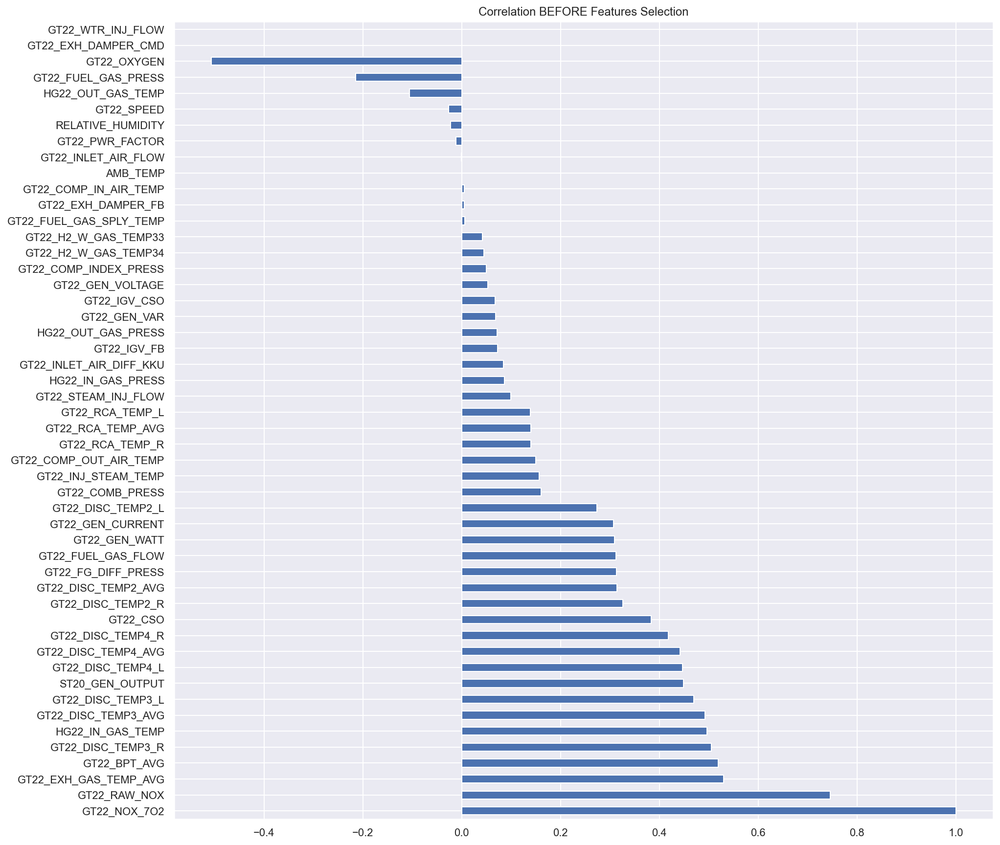

In [11]:
plt.title('Correlation BEFORE Features Selection')
df.corr()['GT22_NOX_7O2'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))

### Heatamp BEFORE Features Selections

<AxesSubplot:>

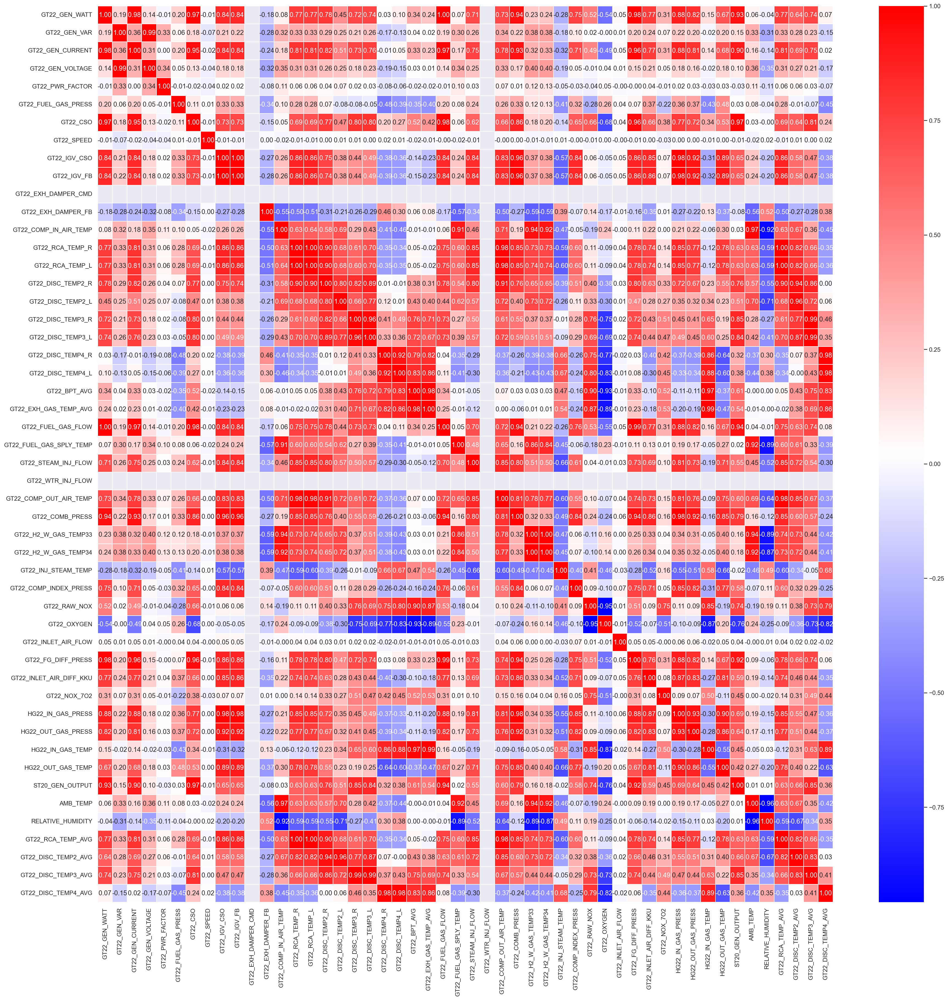

In [12]:
sns.set(rc={'figure.figsize': (30, 30)})
sns.heatmap(df.corr(), cmap ="bwr", annot=True, fmt='.2f', linewidths=0.05)

In [13]:
df.columns

Index(['GT22_GEN_WATT', 'GT22_GEN_VAR', 'GT22_GEN_CURRENT', 'GT22_GEN_VOLTAGE',
       'GT22_PWR_FACTOR', 'GT22_FUEL_GAS_PRESS', 'GT22_CSO', 'GT22_SPEED',
       'GT22_IGV_CSO', 'GT22_IGV_FB', 'GT22_EXH_DAMPER_CMD',
       'GT22_EXH_DAMPER_FB', 'GT22_COMP_IN_AIR_TEMP', 'GT22_RCA_TEMP_R',
       'GT22_RCA_TEMP_L', 'GT22_DISC_TEMP2_R', 'GT22_DISC_TEMP2_L',
       'GT22_DISC_TEMP3_R', 'GT22_DISC_TEMP3_L', 'GT22_DISC_TEMP4_R',
       'GT22_DISC_TEMP4_L', 'GT22_BPT_AVG', 'GT22_EXH_GAS_TEMP_AVG',
       'GT22_FUEL_GAS_FLOW', 'GT22_FUEL_GAS_SPLY_TEMP', 'GT22_STEAM_INJ_FLOW',
       'GT22_WTR_INJ_FLOW', 'GT22_COMP_OUT_AIR_TEMP', 'GT22_COMB_PRESS',
       'GT22_H2_W_GAS_TEMP33', 'GT22_H2_W_GAS_TEMP34', 'GT22_INJ_STEAM_TEMP',
       'GT22_COMP_INDEX_PRESS', 'GT22_RAW_NOX', 'GT22_OXYGEN',
       'GT22_INLET_AIR_FLOW', 'GT22_FG_DIFF_PRESS', 'GT22_INLET_AIR_DIFF_KKU',
       'GT22_NOX_7O2', 'HG22_IN_GAS_PRESS', 'HG22_OUT_GAS_PRESS',
       'HG22_IN_GAS_TEMP', 'HG22_OUT_GAS_TEMP', 'ST20_GEN_OUTPUT',

## Features Selection 
Manual Selection from HeatMap Correlation

In [14]:
#dropcolumns = ['GT22_EXH_DAMPER_CMD','GT22_EXH_DAMPER_FB','GT22_RAW_NOX', 'GT22_GEN_CURRENT', 
#               'GT22_GEN_VOLTAGE','GT22_FG_DIFF_PRESS', 'GT22_RCA_TEMP_R', 'GT22_RCA_TEMP_L',
#               'GT22_DISC_TEMP2_R', 'GT22_DISC_TEMP2_L','GT22_DISC_TEMP3_R', 'GT22_DISC_TEMP3_L',
#               'GT22_DISC_TEMP4_R', 'GT22_DISC_TEMP4_L', 'GT22_OXYGEN', 'GT22_SPEED',
#               'GT22_WTR_INJ_FLOW', 'GT22_IGV_CSO', 'GT22_INLET_AIR_FLOW']
#df.drop(columns=dropcolumns,inplace=True,errors='ignore')

Selected_Features = ['GT22_GEN_WATT', 'GT22_GEN_VAR', 'GT22_PWR_FACTOR','GT22_FUEL_GAS_PRESS',
                     'GT22_CSO', 'GT22_IGV_FB', 'GT22_COMP_IN_AIR_TEMP', 'GT22_BPT_AVG',
                     'GT22_EXH_GAS_TEMP_AVG', 'GT22_FUEL_GAS_FLOW', 'GT22_FUEL_GAS_SPLY_TEMP', 'GT22_STEAM_INJ_FLOW',
                     'GT22_COMP_OUT_AIR_TEMP', 'GT22_COMB_PRESS', 'GT22_H2_W_GAS_TEMP33', 'GT22_H2_W_GAS_TEMP34',
                     'GT22_INJ_STEAM_TEMP', 'GT22_COMP_INDEX_PRESS', 'GT22_INLET_AIR_DIFF_KKU',
                     'HG22_IN_GAS_PRESS', 'HG22_OUT_GAS_PRESS', 'HG22_IN_GAS_TEMP', 'HG22_OUT_GAS_TEMP', 
                     'ST20_GEN_OUTPUT', 'AMB_TEMP', 'RELATIVE_HUMIDITY', 'GT22_NOX_7O2',
                     'GT22_RCA_TEMP_AVG', 'GT22_DISC_TEMP2_AVG', 'GT22_DISC_TEMP3_AVG', 'GT22_DISC_TEMP4_AVG']

### Correlation AFTER Feature Selection

<AxesSubplot:title={'center':'Correlation AFTER Features Selection'}>

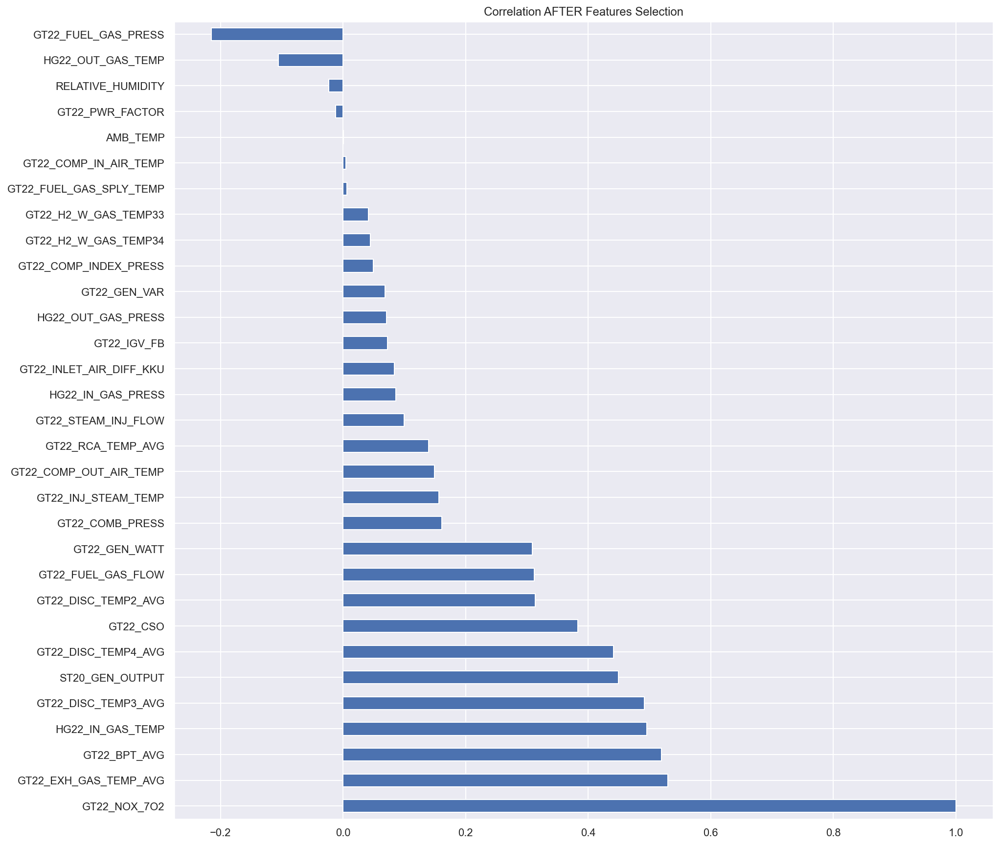

In [15]:
plt.title('Correlation AFTER Features Selection')
df[Selected_Features].corr()['GT22_NOX_7O2'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))

## Correlation Score

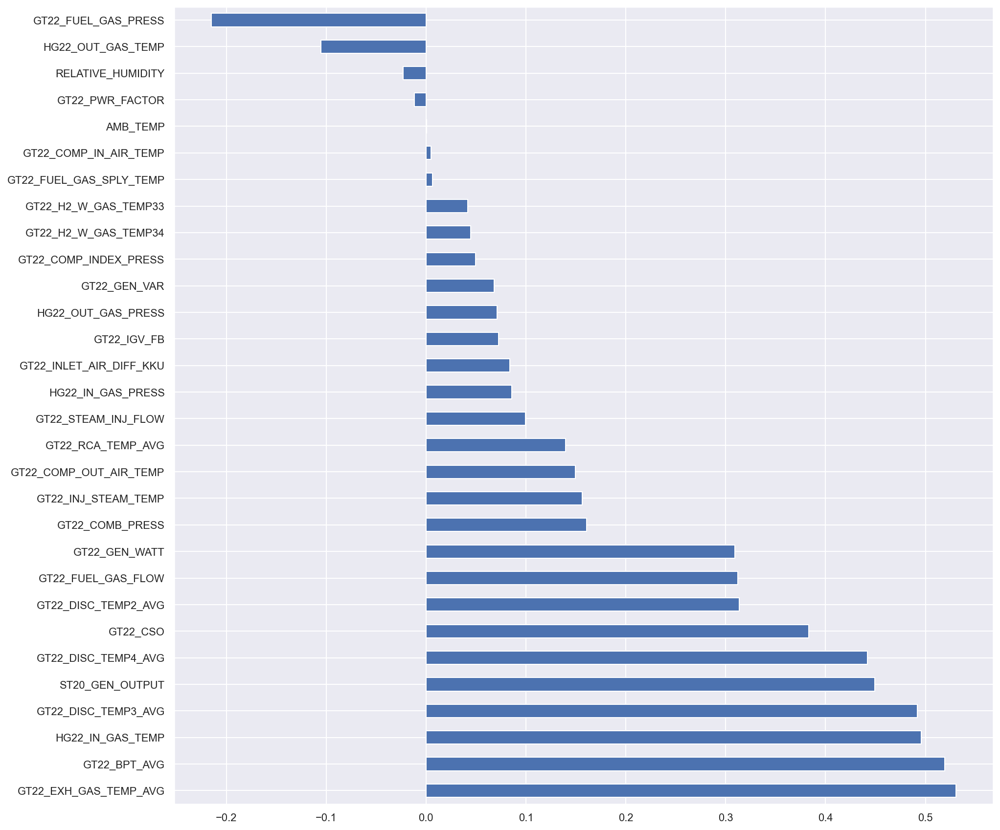

In [16]:
xx = df[Selected_Features].drop('GT22_NOX_7O2', axis=1).apply(lambda x: x.corr(df['GT22_NOX_7O2']))
Result = pd.DataFrame(xx,columns=['Correlation'])
Result['Correlation'].sort_values(ascending=False).plot(kind='barh',figsize=(15,15))
Result = np.abs(Result[['Correlation']])
Result = Result[['Correlation']]*100/Result[['Correlation']].sum()

In [17]:
Result

,Correlation
GT22_GEN_WATT,5.294956
GT22_GEN_VAR,1.170791
GT22_PWR_FACTOR,0.204307
GT22_FUEL_GAS_PRESS,3.685973
GT22_CSO,6.563902
GT22_IGV_FB,1.244541
GT22_COMP_IN_AIR_TEMP,0.084141
GT22_BPT_AVG,8.896161
GT22_EXH_GAS_TEMP_AVG,9.086495
GT22_FUEL_GAS_FLOW,5.343577


# Prediction & Show Feature importance

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score
from statistics import stdev
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import warnings
warnings.filterwarnings('ignore')

In [19]:
# ***** Initial Empty DF *************
empty_list = []
error_tmp = pd.DataFrame(empty_list)
error = pd.DataFrame(empty_list)
predict_all = pd.DataFrame(empty_list)

In [20]:
#Show Feature Importance and Concat Data
def showandconcat(model_name,importance,Result):
    f_imp = pd.DataFrame(importance, index= train.columns,columns=[model_name])
    f_imp.sort_values(by=[model_name],ascending=False)
    
    f_imp.sort_values(by=[model_name],ascending=True).plot(kind='barh',figsize=(10,13))
    title = 'GT22 Features Important from '+model_name
    plt.title(title)
    
    f_imp_p = np.abs(f_imp)*100/np.abs(f_imp).sum()
    Result = pd.concat([Result,f_imp_p],axis=1)
    Result = Result.loc[:,~Result.columns.duplicated()]
    return Result

In [21]:
#Show Testing and Prediction
def showtestpredict(model_name,y_test_org,y_pred_org):
    
    plt.figure(figsize=(20,10))
    plt.title('GT22 NOx Prediction from ' +model_name)
    plt.scatter(test.index,y_test_org,alpha=0.6,label='test')
    plt.scatter(test.index,y_pred_org,alpha=0.6,label='predict')
    plt.xlabel('Date-Time', fontsize=15)
    plt.ylabel('NOx(ppm)', fontsize=15)
    plt.legend()

In [22]:
#Concat DF
def dfconcat(model_name,index_name,in_df,value):
    
#    print(f'Testing {index_name} = {value:.4f}')
    df_tmp = pd.DataFrame(value,columns=[model_name],index=[index_name])
    in_df = pd.concat([in_df,df_tmp],axis=1).drop_duplicates()
    in_df = in_df.loc[:,~in_df.columns.duplicated()]

    return in_df

In [23]:
# to Report and Concat Error Metrics
def error_metrics(model_name,y_test_org,y_pred_org,t_train,t_pred,error):
    
    #mean absolute error
    mae = mean_absolute_error(y_test_org,y_pred_org)
    mae_df = pd.DataFrame(empty_list)
    mae_df = dfconcat(model_name,'MAE(ppm)',mae_df,mae)
    print(f'MAE(ppm) = {mae:0.4f}')
        
    #mean absolute percentage error
    mape = mean_absolute_percentage_error(y_test_org,y_pred_org)*100
    mape_df = pd.DataFrame(empty_list)
    mape_df = dfconcat(model_name,'MAPE(%)',mape_df,mape)
    print(f'MAPE(%) = {mape:0.4f}')
    
    #mean squared error
    mse = mean_squared_error(y_test_org,y_pred_org)
    mse_df = pd.DataFrame(empty_list)
    mse_df = dfconcat(model_name,'MSE',mse_df,mse)
    print(f'MSE = {mse:0.4f}')
    
    #R2
    r2 = r2_score(y_test_org,y_pred_org)
    r2_df = pd.DataFrame(empty_list)
    r2_df = dfconcat(model_name,'R2',r2_df,r2)
    print(f'R2 = {r2:0.4f}')
        
    #error stdev,max,min
    err_abs = abs(y_test_org-y_pred_org)
    err_std = stdev(err_abs)
    err_max = max(err_abs)
    err_min = min(err_abs)
    err_std_df = pd.DataFrame(empty_list)
    err_max_df = pd.DataFrame(empty_list)
    err_min_df = pd.DataFrame(empty_list)
    err_std_df = dfconcat(model_name,'ERR_STDev(ppm)',err_std_df,err_std)
    err_max_df = dfconcat(model_name,'ERR_Max(ppm)',err_max_df,err_max)
    err_min_df = dfconcat(model_name,'ERR_Min(ppm)',err_min_df,err_min)
    print(f'ERR_STDev(ppm) = {err_std:0.4f}')
    print(f'ERR_Max(ppm) = {err_max:0.4f}')
    print(f'ERR_Min(ppm) = {err_min:0.4f}')
    
    #trining and prediction times
    t_train_df = pd.DataFrame(empty_list)
    t_pred_df = pd.DataFrame(empty_list)
    t_train_df = dfconcat(model_name,'Training_Time(sec)',t_train_df,t_train)
    t_pred_df = dfconcat(model_name,'Predict_Time(sec)',t_pred_df,t_pred)
    print(f'Training_time(sec) = {t_train:0.4f}')
    print(f'Predict_time(sec) = {t_pred:0.4f}')

    error = pd.concat([mae_df, mape_df, mse_df, r2_df, err_std_df, err_max_df, err_min_df, t_train_df, t_pred_df])
    return error

## Data Standardization (Normalization)
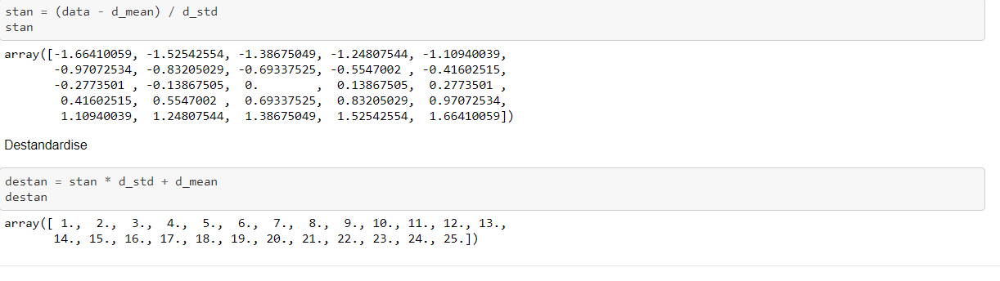

In [24]:
#Prepare Train/Test Data 70:30

train_org, test_org, y_train_org, y_test_org = train_test_split(df[Selected_Features].drop('GT22_NOX_7O2', axis=1), df['GT22_NOX_7O2'], test_size=0.30, random_state=1)

# Standardization
tr_mean = train_org.mean()
tr_std = train_org.std()

train = (train_org - tr_mean)/tr_std
test = (test_org - tr_mean)/tr_std  #use training mean and std


y_train_mean = y_train_org.mean()
y_train_std = y_train_org.std()  

y_train = (y_train_org-y_train_mean)/y_train_std
y_test = (y_test_org-y_train_mean)/y_train_std  #use training mean and std

In [25]:
#Monitor Train Test Ratio
print(f'train shape = {train.shape}')
print(f'test shape = {test.shape}')
print(f'y_train shape = {y_train.shape}')
print(f'y_test shape = {y_test.shape}')

train shape = (27078, 30)
test shape = (11606, 30)
y_train shape = (27078,)
y_test shape = (11606,)


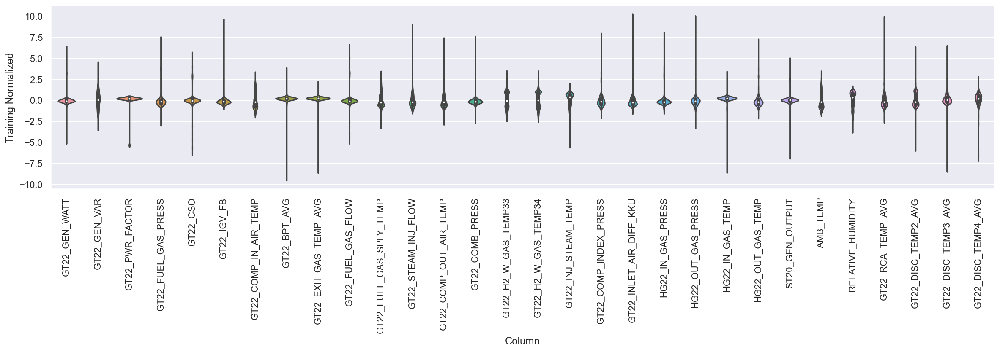

In [26]:
#Training Data after Standardization
df_std_melt = train.melt(var_name='Column', value_name='Training Normalized')
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Training Normalized', data=df_std_melt)
ax.set_xticklabels(train.keys(), rotation=90);

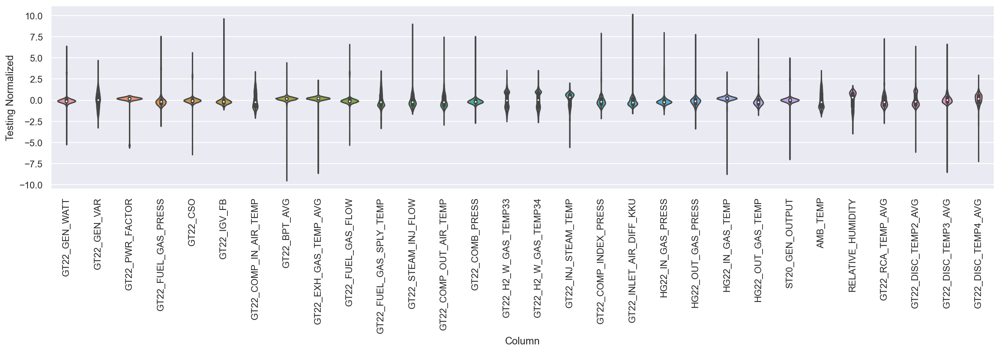

In [27]:
#Testing Data after Standardization
df_std_melt = test.melt(var_name='Column', value_name='Testing Normalized')
plt.figure(figsize=(20, 4))
ax = sns.violinplot(x='Column', y='Testing Normalized', data=df_std_melt)
ax.set_xticklabels(test.keys(), rotation=90);

## Linear Regression 

### Prediction and Error Metric

MAE(ppm) = 1.1563
MAPE(%) = 0.4830
MSE = 2.8811
R2 = 0.3632
ERR_STDev(ppm) = 1.2427
ERR_Max(ppm) = 17.6697
ERR_Min(ppm) = 0.0001
Training_time(sec) = 0.0369
Predict_time(sec) = 0.0040


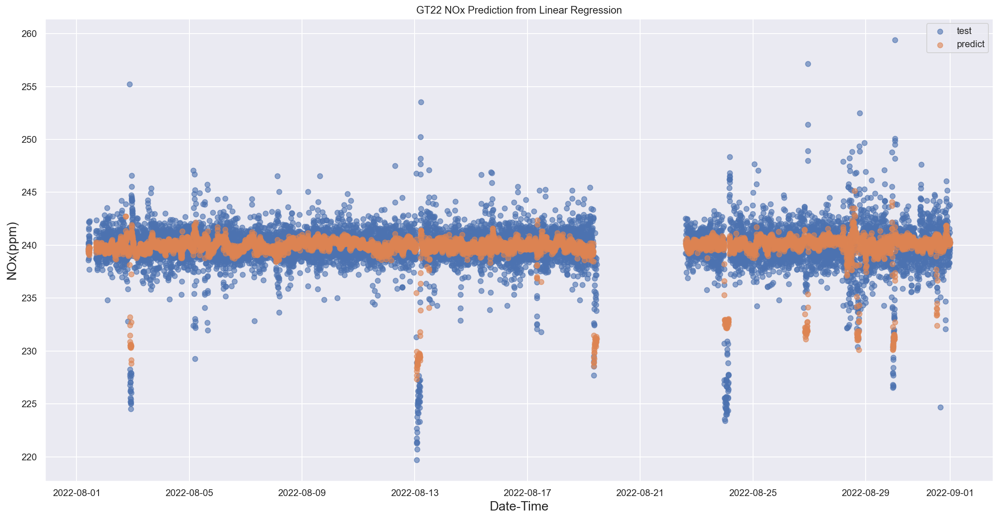

In [28]:
from sklearn.linear_model import LinearRegression

# Modeling
model = LinearRegression()
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)

importance = model.coef_
importance

# Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

# De-standardized
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
test_df = y_test_org.to_frame(name="Actual") 
predict_df = y_pred_org.to_frame(name="Pred_LinearReg")
predict_all = pd.concat([test_df,predict_df],axis=1)

predict_all['Err_LinearReg'] = predict_all['Actual']-predict_all['Pred_LinearReg']
predict_all['AE_LinearReg'] = abs(predict_all['Err_LinearReg'])
predict_all['APE_LinearReg'] = (predict_all['AE_LinearReg'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Linear Regression',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

# Show Prediction Graph
showtestpredict('Linear Regression',y_test_org,y_pred_org)

### Error Distribution

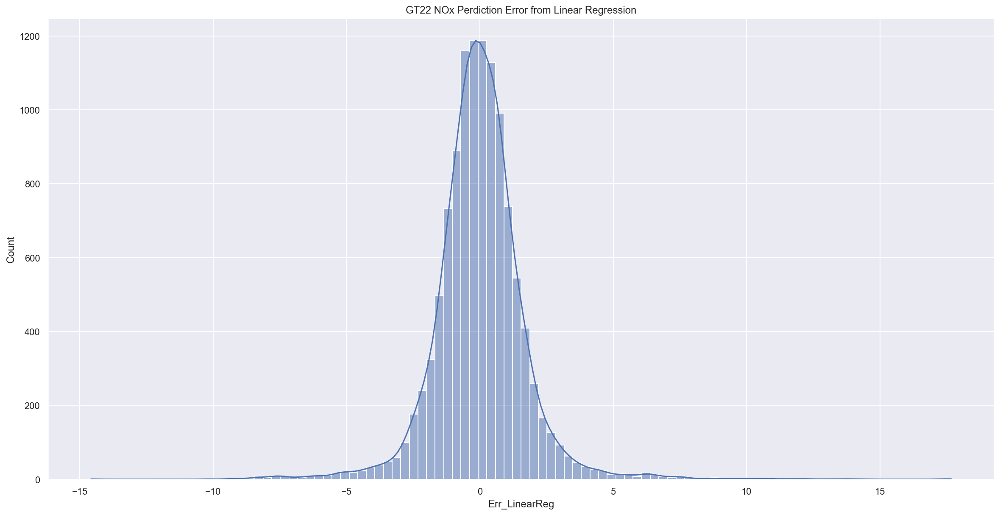

In [29]:
# Show Error Distribution
sns.set(rc={'figure.figsize': (20,10)})
sns.histplot(predict_all['Err_LinearReg'], kde = True, bins=100).set(title="GT22 NOx Perdiction Error from Linear Regression");

### Feature Importance

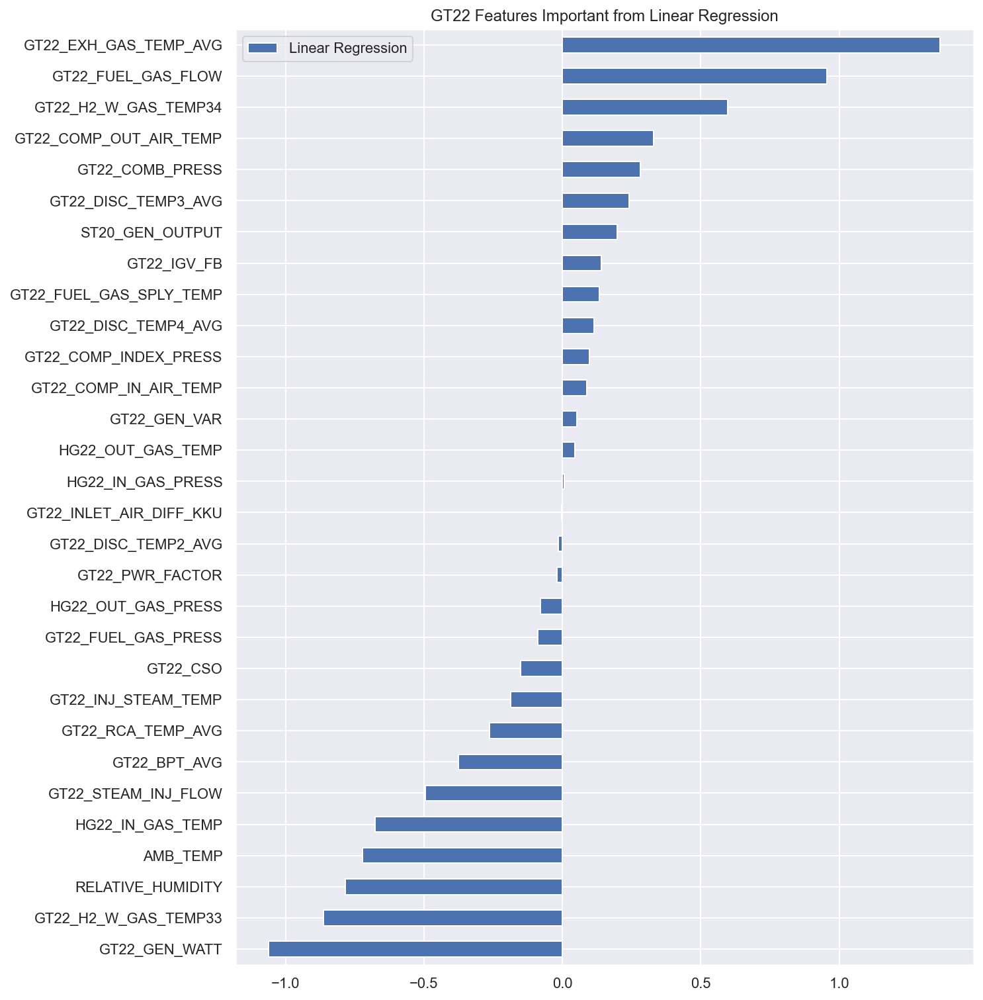

In [30]:
#Feature Importance
Result = showandconcat('Linear Regression',importance,Result)

## Decision Tree

### Prediction and Error Metric

MAE(ppm) = 1.0576
MAPE(%) = 0.4411
MSE = 2.3385
R2 = 0.4832
ERR_STDev(ppm) = 1.1046
ERR_Max(ppm) = 19.1822
ERR_Min(ppm) = 0.0001
Training_time(sec) = 0.7310
Predict_time(sec) = 0.0060


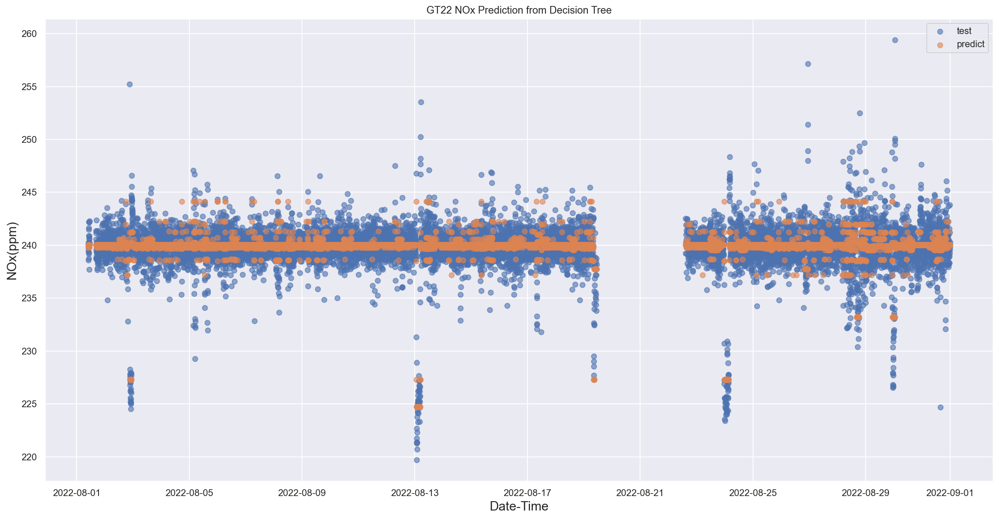

In [31]:
from sklearn.tree import DecisionTreeRegressor

#Modeling
model = DecisionTreeRegressor(criterion='mse',max_depth=8,max_leaf_nodes=100,min_samples_leaf=100,min_samples_split=10)
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)
importance = model.feature_importances_

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_DecisionTree")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_DecisionTree'] = predict_all['Actual']-predict_all['Pred_DecisionTree']
predict_all['AE_DecisionTree'] = abs(predict_all['Err_DecisionTree'])
predict_all['APE_DecisionTree'] = (predict_all['AE_DecisionTree'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Decision Tree',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

# Show Prediction Graph
showtestpredict('Decision Tree',y_test_org,y_pred_org)

### Error Distribution

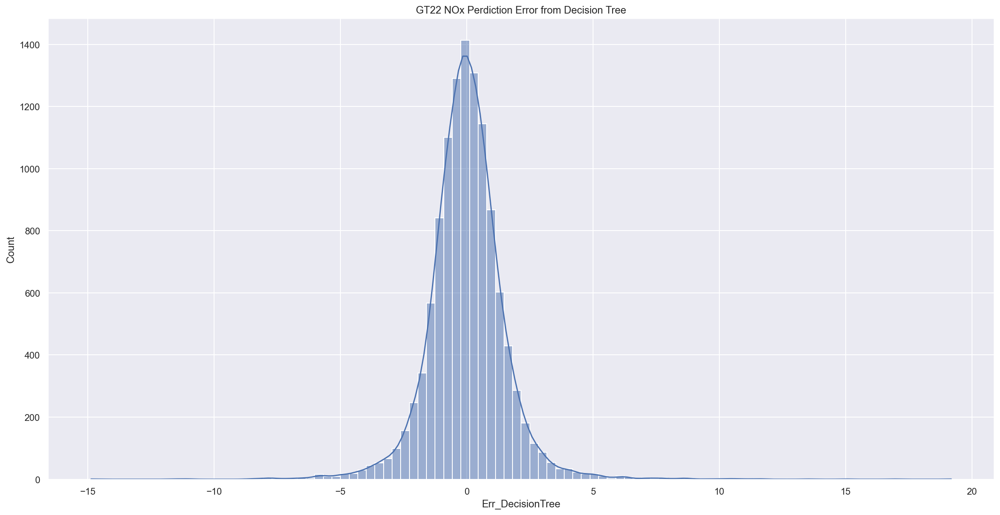

In [32]:
# Show Error Distribution
sns.histplot(predict_all['Err_DecisionTree'], kde = True, bins=100).set(title="GT22 NOx Perdiction Error from Decision Tree");

### Feature Importance

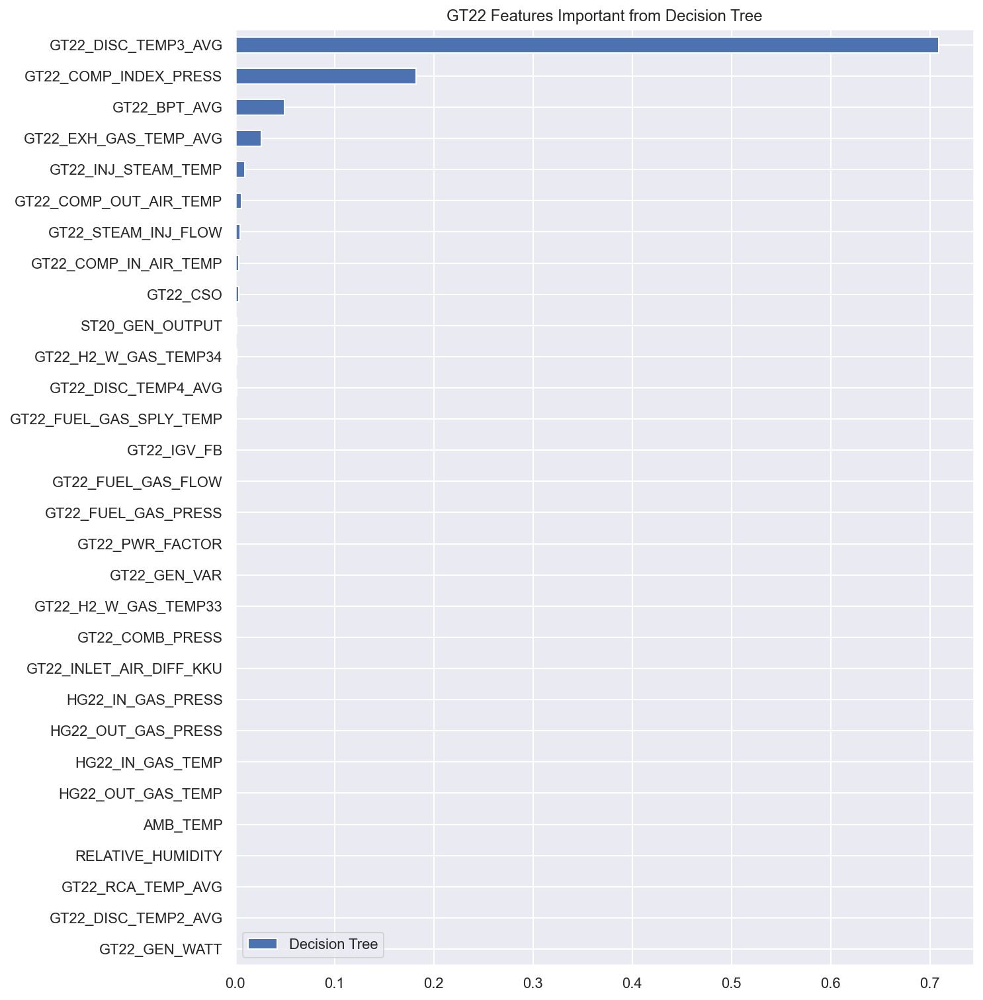

In [33]:
#Feature Importance
Result = showandconcat('Decision Tree',importance,Result)

## Random Forest

### Prediction and Error Metric

MAE(ppm) = 0.9497
MAPE(%) = 0.3959
MSE = 1.7088
R2 = 0.6223
ERR_STDev(ppm) = 0.8983
ERR_Max(ppm) = 18.0201
ERR_Min(ppm) = 0.0001
Training_time(sec) = 172.8354
Predict_time(sec) = 0.6563


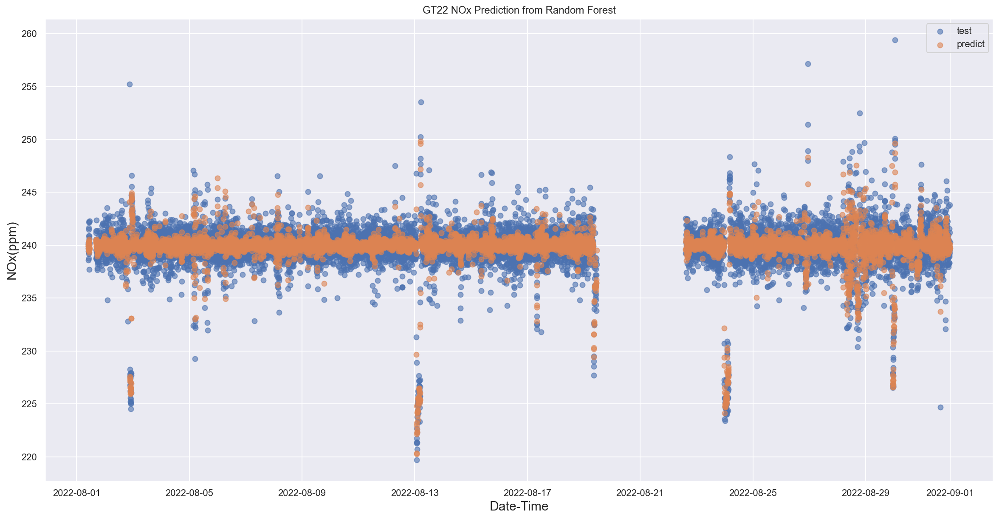

In [34]:
from sklearn.ensemble import RandomForestRegressor

#Modeling
model = RandomForestRegressor()
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)
importance = model.feature_importances_

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_RandomForest")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_RandomForest'] = predict_all['Actual']-predict_all['Pred_RandomForest']
predict_all['AE_RandomForest'] = abs(predict_all['Err_RandomForest'])
predict_all['APE_RandomForest'] = (predict_all['AE_RandomForest'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Random Forest',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

#Show Prediction Graph
showtestpredict('Random Forest',y_test_org,y_pred_org)

### Error Distribution

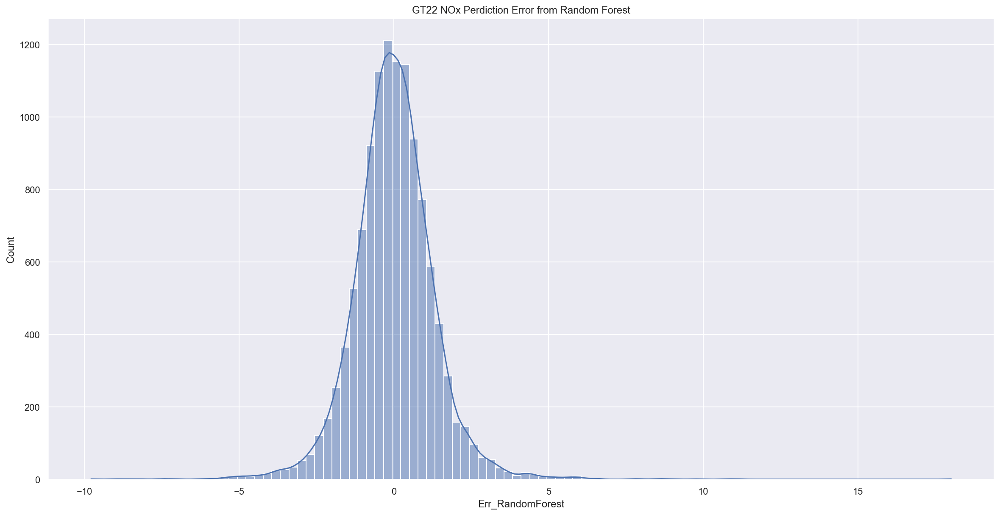

In [35]:
# Show Error Distribution
sns.histplot(predict_all['Err_RandomForest'], kde = True, bins=100).set(title="GT22 NOx Perdiction Error from Random Forest");

### Feature Importance

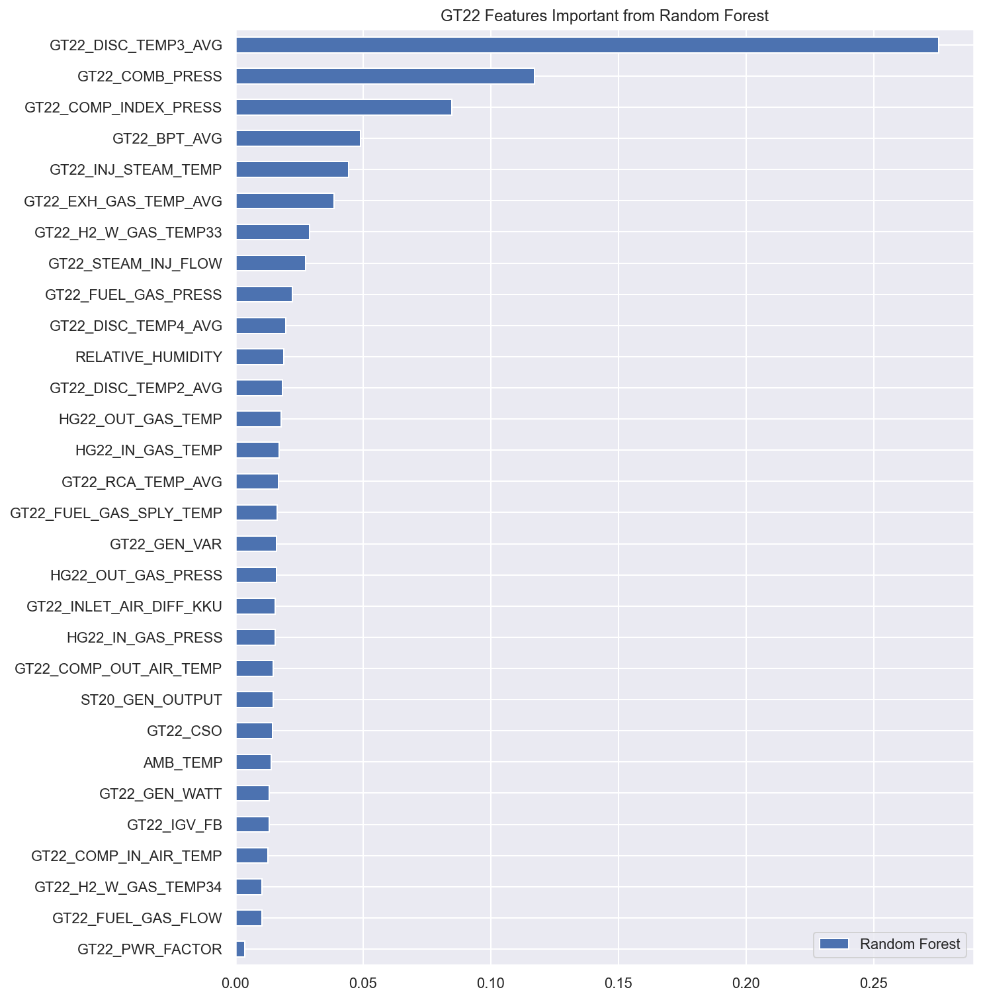

In [36]:
#Feature Importance
Result = showandconcat('Random Forest',importance,Result)

## XGBoost Regression

### Prediction and Error Metric

MAE(ppm) = 0.9598
MAPE(%) = 0.4001
MSE = 1.7137
R2 = 0.6213
ERR_STDev(ppm) = 0.8902
ERR_Max(ppm) = 13.4507
ERR_Min(ppm) = 0.0003
Training_time(sec) = 5.1418
Predict_time(sec) = 0.0349


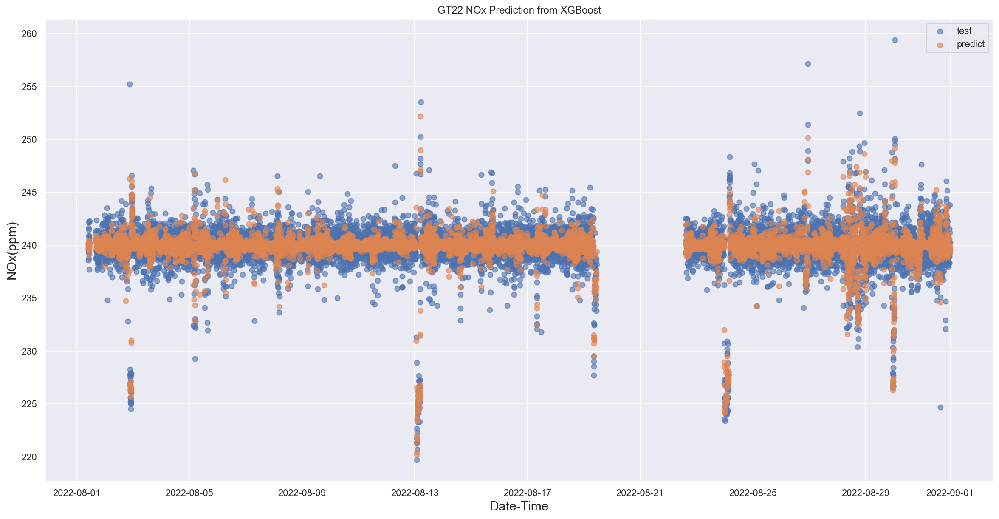

In [37]:
from xgboost import XGBRegressor

#Modeling
model = XGBRegressor()
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)
importance = model.feature_importances_

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time()-t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_XGBoost")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_XGBoost'] = predict_all['Actual']-predict_all['Pred_XGBoost']
predict_all['AE_XGBoost'] = abs(predict_all['Err_XGBoost'])
predict_all['APE_XGBoost'] = (predict_all['AE_XGBoost'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('XGBoost',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

# Show Prediction Graph
showtestpredict('XGBoost',y_test_org,y_pred_org)

### Error Distribution

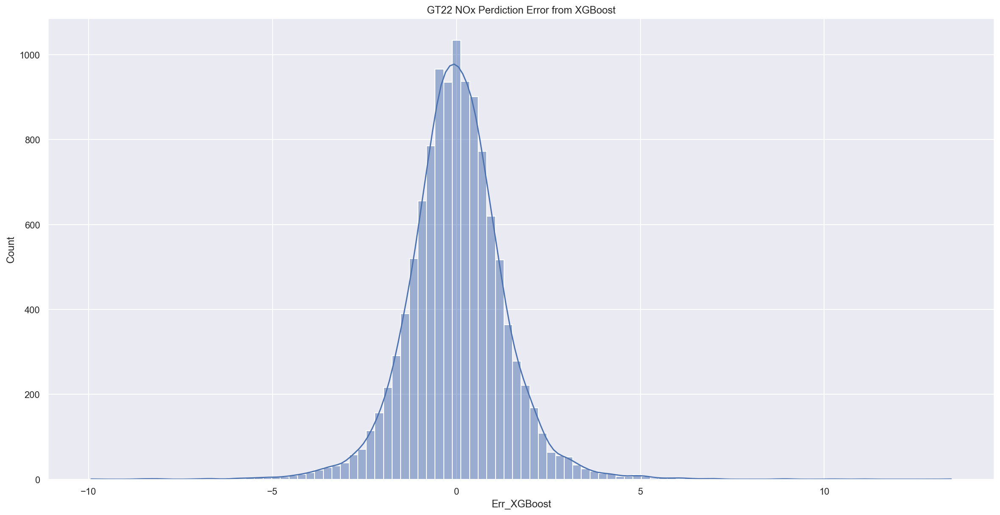

In [38]:
# Show Error Distribution
sns.histplot(predict_all['Err_XGBoost'], kde = True, bins=100).set(title="GT22 NOx Perdiction Error from XGBoost");

###  Feature Importance

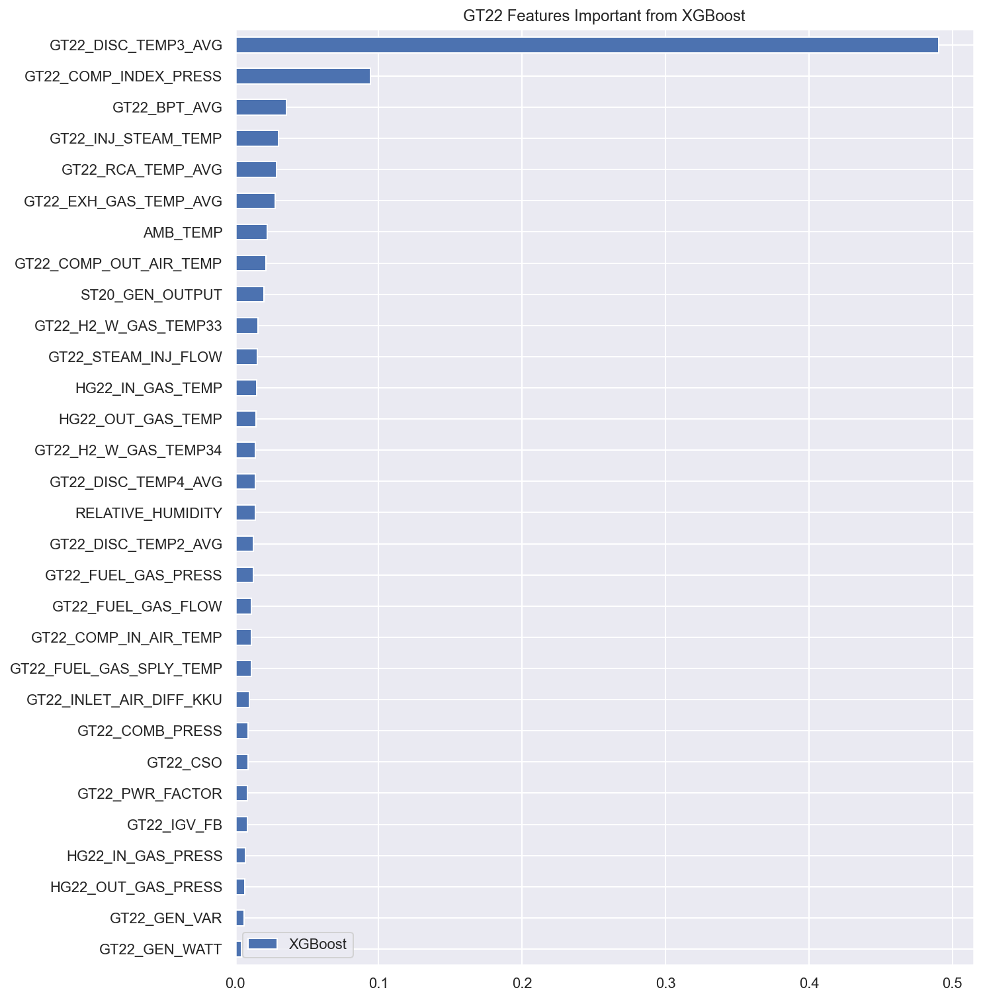

In [39]:
#Feature Importance
Result = showandconcat('XGBoost',importance,Result)

## K-NN Regression

### Prediction and Error Metric

MAE(ppm) = 1.0039
MAPE(%) = 0.4186
MSE = 1.9760
R2 = 0.5633
ERR_STDev(ppm) = 0.9840
ERR_Max(ppm) = 13.0205
ERR_Min(ppm) = 0.0000
Training_time(sec) = 0.0050
Predict_time(sec) = 8.4450


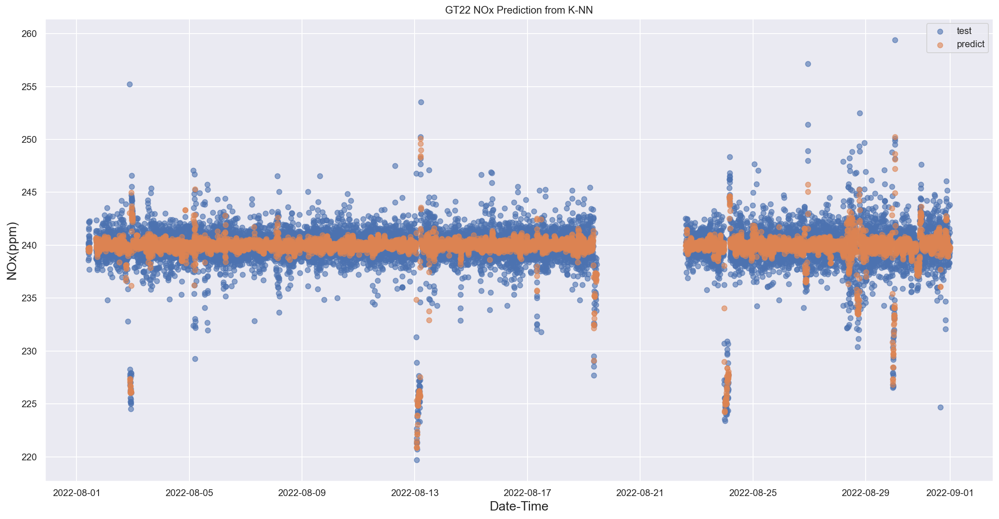

In [40]:
from sklearn.neighbors import KNeighborsRegressor

#Modeling
model = KNeighborsRegressor(n_neighbors= 19)
t0 = time.time()
model.fit(train, y_train)
t_train = (time.time() - t0)

#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index) 
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_KNN")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_KNN'] = predict_all['Actual']-predict_all['Pred_KNN']
predict_all['AE_KNN'] = abs(predict_all['Err_KNN'])
predict_all['APE_KNN'] = (predict_all['AE_KNN'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('K-NN',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

#Show Prediction Graph
showtestpredict('K-NN',y_test_org,y_pred_org)

### Error Distribution

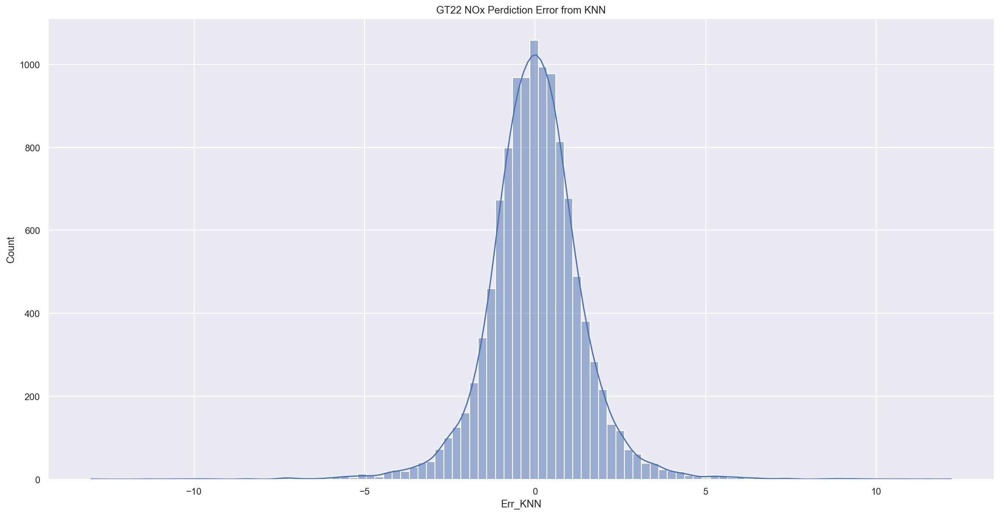

In [41]:
# Show Error Distribution
sns.histplot(predict_all['Err_KNN'], kde = True, bins=100).set(title="GT22 NOx Perdiction Error from KNN");

### Feature Importance

Permu_time(sec) = 3004.8633


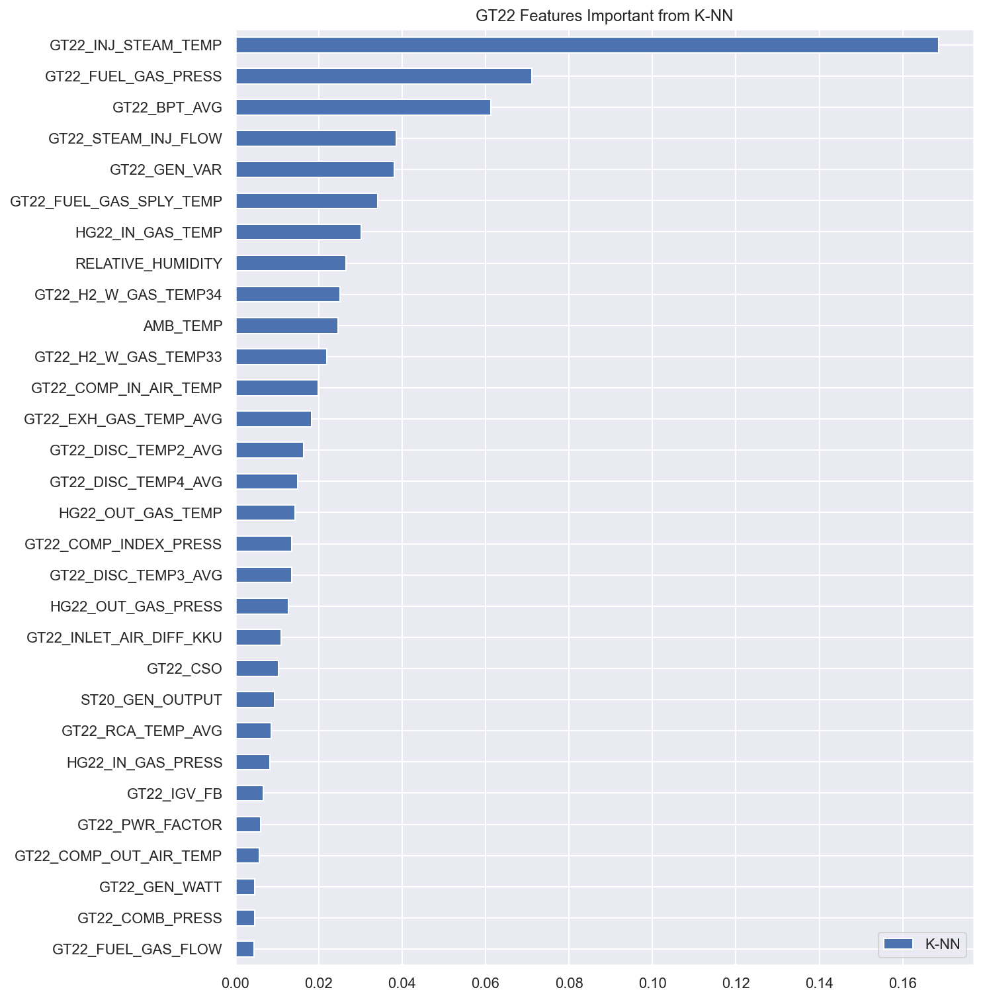

In [42]:
#Feature Importance Calculation
t0 = time.time()
results = permutation_importance(model, train, y_train, scoring='neg_mean_squared_error')
importance = results.importances_mean
t_permu = (time.time()-t0)
print(f'Permu_time(sec) = {t_permu:0.4f}')

#Feature Importance
Result = showandconcat('K-NN',importance,Result)

## Neural Network (Regression)

### Modeling

In [43]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(units=128, activation='relu', input_shape=(len(Selected_Features)-1,)),
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dense(units=128, activation='relu'),
#     tf.keras.layers.Dense(units=512, activation='relu'),
#     tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1)
#     tf.keras.layers.Dense(units=len(outputs), activation='softmax'),
])

# For Regression
model.compile(loss='mean_absolute_error', optimizer=tf.optimizers.Adam(), metrics=['mean_absolute_error'])

train_np = np.array(train).reshape(-1,len(Selected_Features)-1)
y_train_np = np.array(y_train)

#Modeling
t0 = time.time()
model.fit(train_np,y_train_np,epochs=100,verbose=2)
t_train = (time.time() - t0)

Epoch 1/100
847/847 - 3s - loss: 0.5086 - mean_absolute_error: 0.5086 - 3s/epoch - 4ms/step
Epoch 2/100
847/847 - 1s - loss: 0.4828 - mean_absolute_error: 0.4828 - 1s/epoch - 2ms/step
Epoch 3/100
847/847 - 2s - loss: 0.4703 - mean_absolute_error: 0.4703 - 2s/epoch - 2ms/step
Epoch 4/100
847/847 - 2s - loss: 0.4611 - mean_absolute_error: 0.4611 - 2s/epoch - 2ms/step
Epoch 5/100
847/847 - 1s - loss: 0.4554 - mean_absolute_error: 0.4554 - 1s/epoch - 2ms/step
Epoch 6/100
847/847 - 1s - loss: 0.4503 - mean_absolute_error: 0.4503 - 1s/epoch - 2ms/step
Epoch 7/100
847/847 - 2s - loss: 0.4448 - mean_absolute_error: 0.4448 - 2s/epoch - 2ms/step
Epoch 8/100
847/847 - 1s - loss: 0.4394 - mean_absolute_error: 0.4394 - 1s/epoch - 2ms/step
Epoch 9/100
847/847 - 1s - loss: 0.4372 - mean_absolute_error: 0.4372 - 1s/epoch - 2ms/step
Epoch 10/100
847/847 - 2s - loss: 0.4355 - mean_absolute_error: 0.4355 - 2s/epoch - 2ms/step
Epoch 11/100
847/847 - 2s - loss: 0.4301 - mean_absolute_error: 0.4301 - 2s/epo

Epoch 90/100
847/847 - 1s - loss: 0.3347 - mean_absolute_error: 0.3347 - 1s/epoch - 2ms/step
Epoch 91/100
847/847 - 1s - loss: 0.3349 - mean_absolute_error: 0.3349 - 1s/epoch - 2ms/step
Epoch 92/100
847/847 - 1s - loss: 0.3319 - mean_absolute_error: 0.3319 - 1s/epoch - 2ms/step
Epoch 93/100
847/847 - 2s - loss: 0.3331 - mean_absolute_error: 0.3331 - 2s/epoch - 2ms/step
Epoch 94/100
847/847 - 2s - loss: 0.3314 - mean_absolute_error: 0.3314 - 2s/epoch - 2ms/step
Epoch 95/100
847/847 - 1s - loss: 0.3304 - mean_absolute_error: 0.3304 - 1s/epoch - 2ms/step
Epoch 96/100
847/847 - 1s - loss: 0.3291 - mean_absolute_error: 0.3291 - 1s/epoch - 2ms/step
Epoch 97/100
847/847 - 2s - loss: 0.3295 - mean_absolute_error: 0.3295 - 2s/epoch - 2ms/step
Epoch 98/100
847/847 - 2s - loss: 0.3277 - mean_absolute_error: 0.3277 - 2s/epoch - 2ms/step
Epoch 99/100
847/847 - 2s - loss: 0.3268 - mean_absolute_error: 0.3268 - 2s/epoch - 2ms/step
Epoch 100/100
847/847 - 1s - loss: 0.3271 - mean_absolute_error: 0.327

### Prediction

363/363 [==============================] - 1s 1ms/step
MAE(ppm) = 0.9772
MAPE(%) = 0.4075
MSE = 1.7160
R2 = 0.6207
ERR_STDev(ppm) = 0.8724
ERR_Max(ppm) = 12.8766
ERR_Min(ppm) = 0.0000
Training_time(sec) = 148.4762
Predict_time(sec) = 0.7620


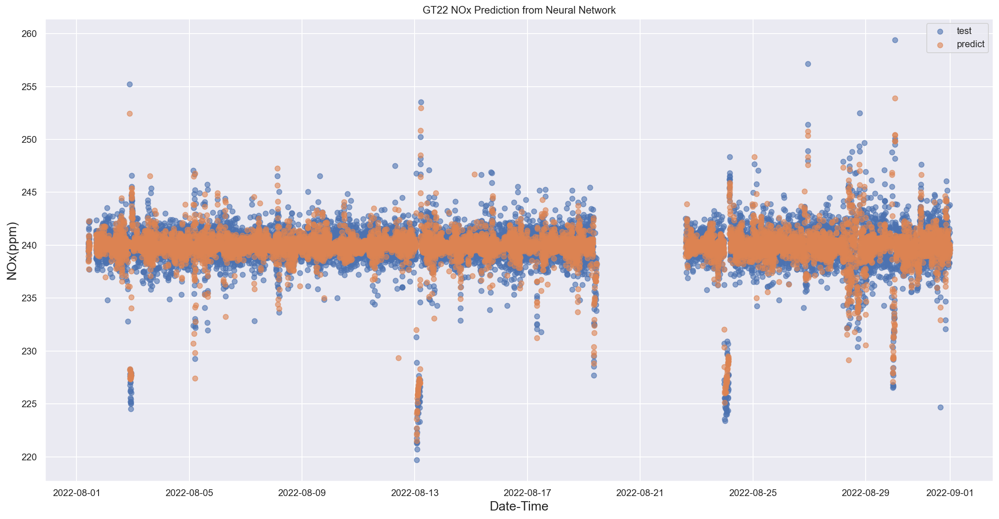

In [44]:
#Prediction
t0 = time.time()
y_pred = model.predict(test)
t_pred = (time.time() - t0)

#Prediction data become normalized (De-standardized)
y_pred = pd.Series(y_pred.reshape(-1,),index=y_test.index)
y_pred_org = y_pred*y_train_std+y_train_mean

# Data for MANUAL CHECK Test, Predict, Error, Abs(Error), APE
predict_df = y_pred_org.to_frame(name="Pred_NN")
predict_all = pd.concat([predict_all,predict_df],axis=1)

predict_all['Err_NN'] = predict_all['Actual']-predict_all['Pred_NN']
predict_all['AE_NN'] = abs(predict_all['Err_NN'])
predict_all['APE_NN'] = (predict_all['AE_NN'] / predict_all['Actual'])*100

# Report and Concat Error Metric
error_tmp = error_metrics('Neural Network',y_test_org,y_pred_org,t_train,t_pred,error_tmp)
error = pd.concat([error,error_tmp],axis=1)

#Show Prediction Graph
showtestpredict('Neural Network',y_test_org,y_pred_org)

### Error Distribution

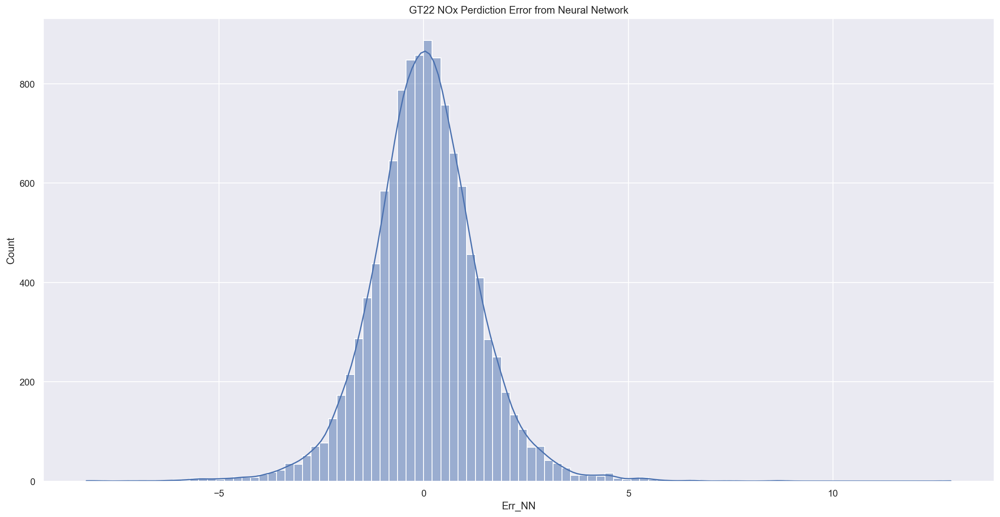

In [45]:
# Show Error Distribution
sns.histplot(predict_all['Err_NN'], kde = True, bins=100).set(title="GT22 NOx Perdiction Error from Neural Network");

### Feature Importance

847/847 [==============================] - 1s 891us/step


847/847 [==============================] - 1s 1ms/step
Permu_time(sec) = 203.1513


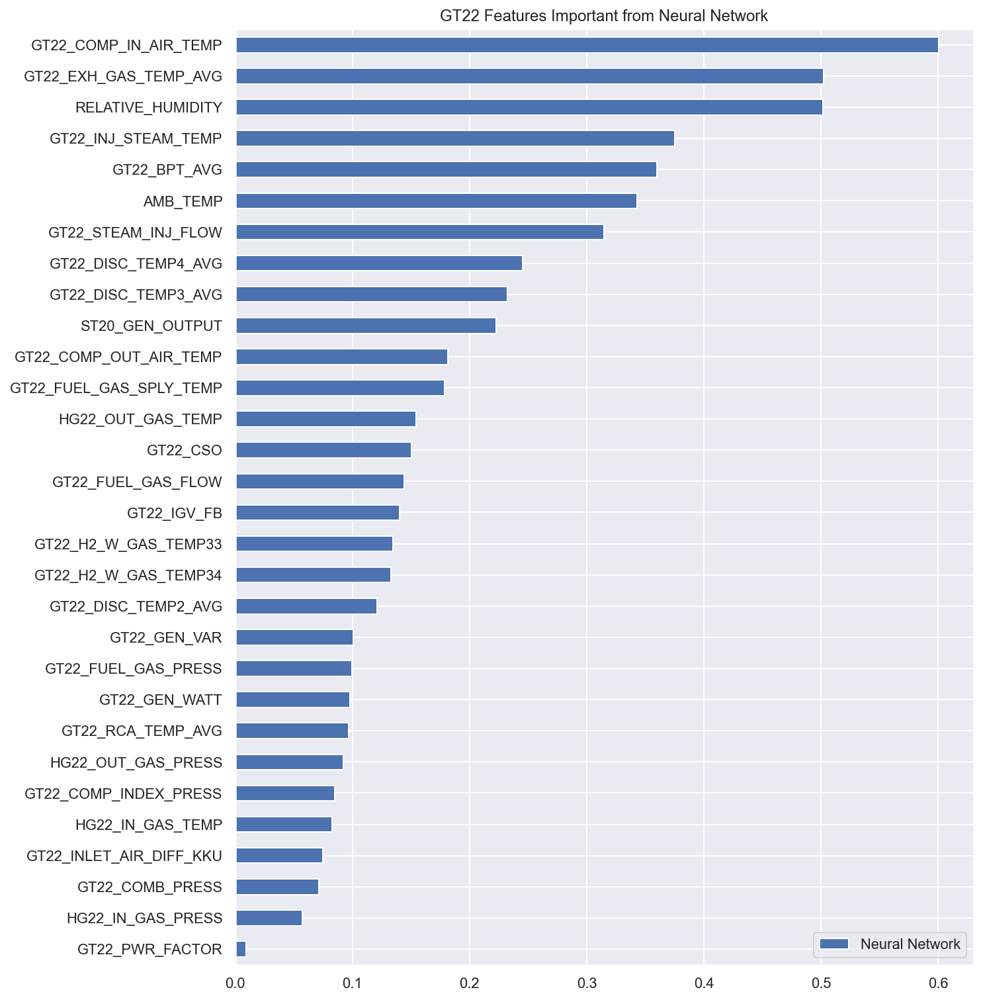

In [46]:
#Permutation Feature Importance
t0 = time.time()
results = permutation_importance(model, train, y_train, scoring='neg_mean_absolute_error')
importance = results.importances_mean
t_permu = (time.time()-t0)
print(f'Permu_time(sec) = {t_permu:0.4f}')

#Feature Importance
Result = showandconcat('Neural Network',importance,Result)

# Show The Result

## Shown Error Metrics

In [47]:
error

,Linear Regression,Decision Tree,Random Forest,XGBoost,K-NN,Neural Network
MAE(ppm),1.156253,1.057587,0.949715,0.959820,1.003931,9.772049e-01
MAPE(%),0.482977,0.441082,0.395878,0.400148,0.418603,4.075469e-01
MSE,2.881130,2.338504,1.708847,1.713651,1.976047,1.715964e+00
R2,0.363227,0.483155,0.622319,0.621257,0.563264,6.207459e-01
ERR_STDev(ppm),1.242716,1.104590,0.898308,0.890205,0.983999,8.724108e-01
ERR_Max(ppm),17.669676,19.182195,18.020100,13.450701,13.020526,1.287664e+01
ERR_Min(ppm),0.000141,0.000088,0.000100,0.000289,0.000000,6.103515e-07
Training_Time(sec),0.036901,0.731043,172.835436,5.141772,0.004987,1.484762e+02
Predict_Time(sec),0.003989,0.005984,0.656312,0.034906,8.444969,7.619607e-01


In [48]:
Result.sum()

Correlation          100.000000
Linear Regression    100.000000
Decision Tree        100.000000
Random Forest        100.000000
XGBoost               99.999985
K-NN                 100.000000
Neural Network       100.000000
dtype: float64

## Export Error Metrics and Feature Importance

In [49]:
error.to_excel('GT22_Aug22_Error_Result.xlsx')
Result.to_excel('GT22_Aug22_Feature_Importance.xlsx')
predict_all.to_excel('GT22_Aug22_Predict_all.xlsx')

## Feature Importance average from all Models

<AxesSubplot:>

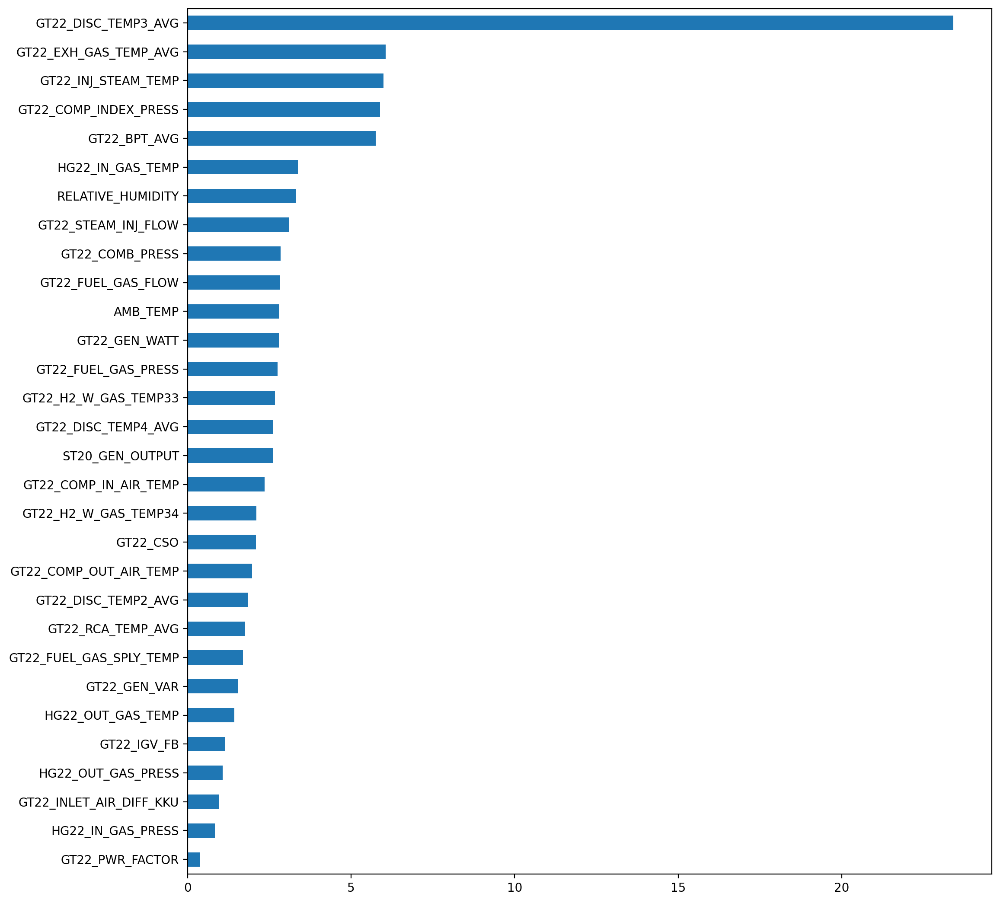

In [50]:
Result['Mean'] = Result.mean(axis=1)
Result['Sum'] = Result.sum(axis=1)-Result['Mean'] #Exclude Mean Column

plt.style.use('default')
Result['Mean'].sort_values().plot(kind='barh',figsize=(12,13))

In [51]:
#Result
Result.sort_values(by=['Mean'],ascending=False)

,Correlation,Linear Regression,Decision Tree,Random Forest,XGBoost,K-NN,Neural Network,Mean,Sum
GT22_DISC_TEMP3_AVG,8.428129,2.302016,70.850874,27.529070,49.017895,1.813020,3.939340,23.411478,163.880344
GT22_EXH_GAS_TEMP_AVG,9.086495,13.087087,2.602407,3.874057,2.777477,2.466666,8.509860,6.057721,42.404048
GT22_INJ_STEAM_TEMP,2.676800,1.802794,0.972298,4.431479,3.036730,22.651544,6.357062,5.989815,41.928707
GT22_COMP_INDEX_PRESS,0.849639,0.926326,18.227897,8.473945,9.406831,1.824929,1.442162,5.878818,41.151729
GT22_BPT_AVG,8.896161,3.606548,4.978201,4.905270,3.558842,8.232093,6.094892,5.753144,40.272007
HG22_IN_GAS_TEMP,8.495991,6.495690,0.000000,1.715576,1.475765,4.051148,1.398791,3.376137,23.632960
RELATIVE_HUMIDITY,0.393535,7.515658,0.000000,1.904164,1.401301,3.572608,8.496704,3.326281,23.283970
GT22_STEAM_INJ_FLOW,1.707728,4.748972,0.515668,2.766095,1.539613,5.186818,5.334094,3.114141,21.798988
GT22_COMB_PRESS,2.755887,2.696179,0.000000,11.714504,0.906860,0.622589,1.204719,2.842963,19.900738
GT22_FUEL_GAS_FLOW,5.343577,9.172893,0.000000,1.040328,1.111713,0.595355,2.447506,2.815910,19.711372


## Feature Importance on Box Plot

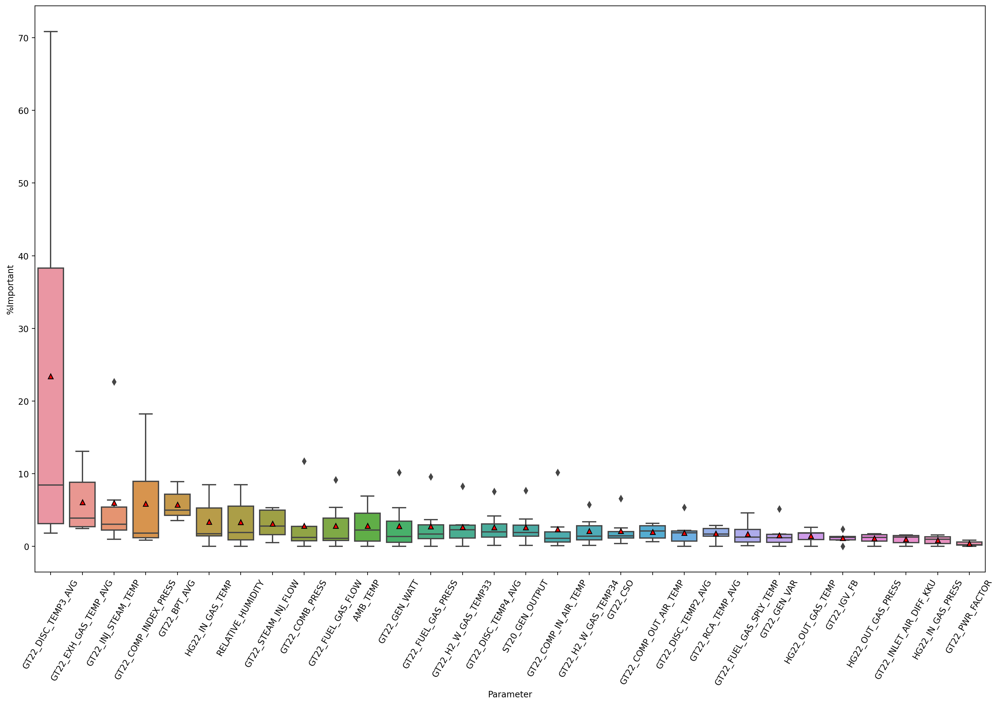

In [52]:
#plt.style.available

Result_T = Result.sort_values(by=['Mean'],ascending=False).drop(columns=['Sum','Mean']).transpose()
# Result_T.plot.hist(bins=60,figsize=(15,6),alpha=0.3)

#before normalization 
Result_T_melt = Result_T.melt(var_name='Parameter', value_name='%Important')
#.melt to transform to Long Format (like before pivot table)
plt.figure(figsize=(20, 12))
ax = sns.boxplot(x='Parameter', y='%Important', data=Result_T_melt,showmeans=True,meanprops={
                       "markerfacecolor":"red", 
                       "markeredgecolor":"black",
                      "markersize":"6"})
ax.set_xticklabels(Result_T.keys(), rotation=60);

## Report All Features 

In [53]:
Des = Result.drop(columns=['Sum','Mean']).transpose().describe()
Des

,GT22_GEN_WATT,GT22_GEN_VAR,GT22_PWR_FACTOR,GT22_FUEL_GAS_PRESS,GT22_CSO,GT22_IGV_FB,GT22_COMP_IN_AIR_TEMP,GT22_BPT_AVG,GT22_EXH_GAS_TEMP_AVG,GT22_FUEL_GAS_FLOW,GT22_FUEL_GAS_SPLY_TEMP,GT22_STEAM_INJ_FLOW,GT22_COMP_OUT_AIR_TEMP,GT22_COMB_PRESS,GT22_H2_W_GAS_TEMP33,GT22_H2_W_GAS_TEMP34,GT22_INJ_STEAM_TEMP,GT22_COMP_INDEX_PRESS,GT22_INLET_AIR_DIFF_KKU,HG22_IN_GAS_PRESS,HG22_OUT_GAS_PRESS,HG22_IN_GAS_TEMP,HG22_OUT_GAS_TEMP,ST20_GEN_OUTPUT,AMB_TEMP,RELATIVE_HUMIDITY,GT22_RCA_TEMP_AVG,GT22_DISC_TEMP2_AVG,GT22_DISC_TEMP3_AVG,GT22_DISC_TEMP4_AVG
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000
mean,2.790651,1.533215,0.369699,2.749071,2.095318,1.147289,2.360111,5.753144,6.057721,2.815910,1.689332,3.114141,1.977740,2.842963,2.670323,2.101408,5.989815,5.878818,0.963088,0.840793,1.076288,3.376137,1.427461,2.609203,2.811256,3.326281,1.757847,1.841057,23.411478,2.622441
std,3.700900,1.701530,0.339718,3.217486,2.080289,0.714243,3.541478,2.116711,4.182537,3.312936,1.625365,1.967536,1.034470,4.045125,2.704959,1.919460,7.556232,6.552596,0.674796,0.622648,0.627020,3.111196,0.910485,2.491985,2.714085,3.409251,0.979103,1.793429,27.199593,2.503408
min,0.000000,0.000000,0.000000,0.000000,0.363870,0.000000,0.084141,3.558842,2.466666,0.000000,0.084279,0.515668,0.644402,0.000000,0.000000,0.129431,0.972298,0.849639,0.000000,0.000000,0.000000,0.000000,0.000000,0.132556,0.000000,0.000000,0.000000,0.000000,1.813020,0.124702
25%,0.534573,0.560204,0.168232,1.043277,1.134640,0.866230,0.603692,4.255909,2.689942,0.817841,0.604705,1.623671,1.138128,0.764725,1.138345,0.903869,2.239797,1.184244,0.499934,0.385389,0.717511,1.437278,0.926478,1.374152,0.709094,0.897418,1.398421,0.700028,3.120678,1.257206
50%,1.336625,1.170791,0.204307,1.685527,1.447703,1.244541,1.107048,4.978201,3.874057,1.111713,1.269879,2.766095,2.122817,1.204719,2.278769,1.410405,3.036730,1.824929,1.265181,0.965671,1.221070,1.715576,1.799011,1.899471,2.223107,1.904164,1.694206,1.855001,8.428129,1.976025
75%,3.476899,1.654461,0.591935,2.956271,2.011234,1.341004,1.976467,7.163493,8.798177,3.895541,2.332633,4.967895,2.815409,2.726033,2.930426,2.814438,5.394271,8.940388,1.461011,1.298026,1.582322,5.273419,1.864590,2.895210,4.559789,5.544133,2.463934,2.128868,38.273483,3.087489
max,10.174986,5.132380,0.863252,9.558871,6.563902,2.372013,10.169271,8.896161,13.087087,9.172893,4.596488,5.334094,3.169884,11.714504,8.275953,5.733404,22.651544,18.227897,1.554545,1.553052,1.713279,8.495991,2.611078,7.693668,6.917921,8.496704,2.886009,5.374610,70.850874,7.566973


In [54]:
# Export to Excel
Result[['Mean']].sort_values(['Mean'],ascending=False).to_excel('GT22_Feat_Result.xlsx')

## Pair Plot Top5 Features

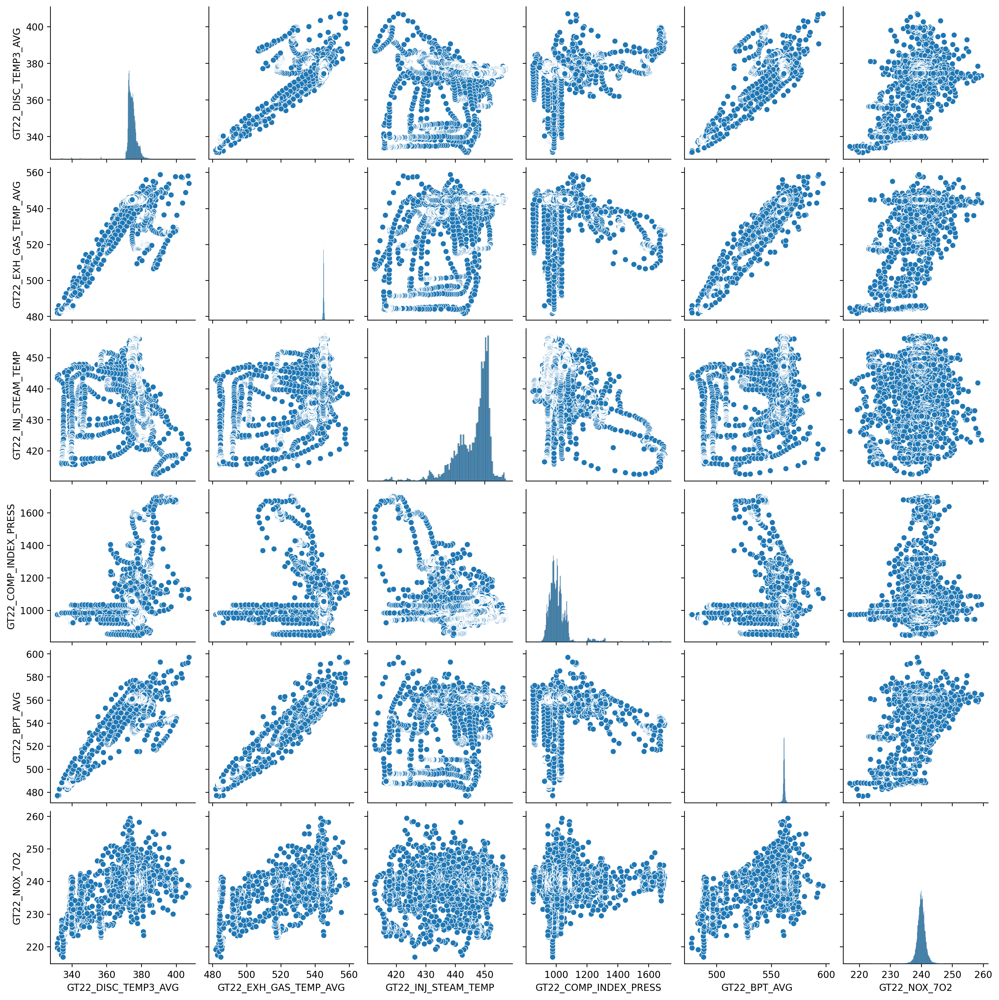

In [55]:
Top = Result[['Mean']].sort_values(['Mean'],ascending=False)
Top5_list = Top.index[0:5]
Top5_df = pd.concat([df[Top5_list],df["GT22_NOX_7O2"]],axis=1)
sns.pairplot(Top5_df);

# Report CPU Info

In [56]:
%load_ext watermark
%watermark

Last updated: 2022-09-11T19:35:29.438984+07:00

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.29.0

Compiler    : MSC v.1916 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 142 Stepping 12, GenuineIntel
CPU cores   : 8
Architecture: 64bit

